In [2]:
import h5py
import torch

import numpy as np

from gwpy.timeseries import TimeSeries
from ml4gw.transforms import SpectralDensity, Whiten
from matplotlib import pyplot as plt
%matplotlib inline

FILE = "/home/katya.govorkova/gwak2/gwak/output/BBC_AnalysisReady_Cat12/HL/background-1402704035-3608.h5"
SAMPLE_RATE = 4096
FFTLENGTH = 2
HIGHPASS = 30

/home/katya.govorkova/miniconda3/envs/gwak/lib/python3.11/site-packages/gwpy/time/__init__.py:36: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(False)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  from lal import LIGOTimeGPS


In [54]:
def load_h5_as_dict(
    chosen_signals: Path,
    source_file: Path
)-> dict:
    """Open up a buffer to load in different CCSN wavefroms.

    Args:
        chosen_signals (Path): A file with names of each wavefrom.
        source_file (Path): The path that contains reasmpled raw waveform.

    Returns:
        dict: Time and resampled SQDM of Each waveform
    """
    with open(chosen_signals) as f:
        selected_ccsn = yaml.load(f, Loader=yaml.SafeLoader)

    source_file = Path(source_file)

    grand_dict = {}
    ccsn_list = []

    for key in selected_ccsn.keys():

        for name in selected_ccsn[key]:
            ccsn_list.append(f"{key}/{name}")

    for name in ccsn_list:

        with h5py.File(source_file/ f'{name}.h5', 'r', locking=False) as h:

            time = np.array(h['time'][:])
            quad_moment = h['quad_moment'][:]

        grand_dict[name] =  [time, quad_moment]

    return grand_dict

class CleanGlitchPairedDataset(torch.utils.data.IterableDataset):
    def __init__(self, clean_ds, glitch_ds):
        self.clean_ds = clean_ds
        self.glitch_ds = glitch_ds

    def __len__(self):
        return len(self.clean_ds)

    def __iter__(self):
        if self.glitch_ds is None:
            for clean_x in iter(self.clean_ds):
                yield clean_x, None
        else:
            for clean_x, glitch_x in zip(iter(self.clean_ds), iter(self.glitch_ds)):
                yield clean_x, glitch_x



In [3]:
from typing import Union

import torch
from scipy.signal import iirfilter
from torchaudio.functional import filtfilt


class IIRFilter(torch.nn.Module):
    r"""
    IIR digital and analog filter design given order and critical points.
    Design an Nth-order digital or analog filter and apply it to a signal.
    Uses SciPy's ``iirfilter`` function to create the filter coefficients.
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iirfilter.html

    The forward call of this module accepts a batch tensor of shape
    (n_waveforms, n_samples) and returns the filtered waveforms.

    Args:
        N:
            The order of the filter.
        Wn:
            A scalar or length-2 sequence giving the critical frequencies.
            For digital filters, Wn are in the same units as fs. By
            default, fs is 2 half-cycles/sample, so these are normalized
            from 0 to 1, where 1 is the Nyquist frequency. (Wn is thus in
            half-cycles / sample). For analog filters, Wn is an angular
            frequency (e.g., rad/s). When Wn is a length-2 sequence,``Wn[0]``
            must be less than ``Wn[1]``.
        rp:
            For Chebyshev and elliptic filters, provides the maximum ripple in
            the passband. (dB)
        rs:
            For Chebyshev and elliptic filters, provides the minimum
            attenuation in the stop band. (dB)
        btype:
            The type of filter. Default is 'bandpass'.
        analog:
            When True, return an analog filter, otherwise a digital filter
            is returned.
        ftype:
            The type of IIR filter to design:

                - Butterworth   : 'butter'
                - Chebyshev I   : 'cheby1'
                - Chebyshev II  : 'cheby2'
                - Cauer/elliptic: 'ellip'
                - Bessel/Thomson: 'bessel's
        fs:
            The sampling frequency of the digital system.

    Returns:
        Filtered signal on the forward pass.
    """  # noqa: E501

    def __init__(
        self,
        N: int,
        Wn: Union[float, torch.Tensor],
        rs: Union[None, float, torch.Tensor] = None,
        rp: Union[None, float, torch.Tensor] = None,
        btype="band",
        analog=False,
        ftype="butter",
        fs=None,
    ) -> None:
        super().__init__()

        if isinstance(Wn, torch.Tensor):
            Wn = Wn.numpy()
        if isinstance(rs, torch.Tensor):
            rs = rs.numpy()
        if isinstance(rp, torch.Tensor):
            rp = rp.numpy()

        b, a = iirfilter(
            N,
            Wn,
            rs=rs,
            rp=rp,
            btype=btype,
            analog=analog,
            ftype=ftype,
            output="ba",
            fs=fs,
        )
        self.register_buffer("b", torch.tensor(b))
        self.register_buffer("a", torch.tensor(a))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        r"""
        Apply the filter to the input signal.

        Args:
            x:
                The input signal to be filtered.

        Returns:
            The filtered signal.
        """
        return filtfilt(x, self.a, self.b, clamp=False)

In [116]:
bandpass_filter = IIRFilter( 
    N=4,                    # Filter order 
    Wn=30,# Critical frequencies [low, high] in Hz 
    btype="highpass",           # Bandpass filter type 
    ftype="butter",         # Butterworth filter 
    fs=SAMPLE_RATE          # Sampling frequency 
) 
# After constructing bandpass_filter (once):
bandpass_filter.a = bandpass_filter.a.float().to('cuda')
bandpass_filter.b = bandpass_filter.b.float().to('cuda')

In [113]:
with h5py.File(FILE, "r") as f:

    seg_data_h1 = f["H1"][:SAMPLE_RATE*128]
    # seg_data_h1 = seg_data_h1.astype("float64")

    seg_data_l1 = f["L1"][:SAMPLE_RATE*128]
    # seg_data_l1 = seg_data_l1.astype("float64")

gwpy_data_h1 = TimeSeries(
    seg_data_h1,
    sample_rate=SAMPLE_RATE
)
gwpy_data_l1 = TimeSeries(
    seg_data_l1,
    sample_rate=SAMPLE_RATE
)

newdata_h1 = bandpass_filter(torch.Tensor(seg_data_h1)) # highpass_fft_batch(gwpy_data_h1, SAMPLE_RATE, HIGHPASS) # gwpy_data_h1.highpass(HIGHPASS)
newdata_l1 = bandpass_filter(torch.Tensor(seg_data_l1)) # highpass_fft_batch(gwpy_data_l1, SAMPLE_RATE, HIGHPASS) # gwpy_data_l1.highpass(HIGHPASS)

In [114]:
seg_data_h1 = seg_data_h1.reshape((128, 1, 4096))
seg_data_l1 = seg_data_l1.reshape((128, 1, 4096))
seg_data = np.concatenate((seg_data_h1, seg_data_l1), axis=1)seg_data = bandpass_filter(torch.Tensor(seg_data))

SyntaxError: invalid syntax (3130153203.py, line 3)

torch.Size([1, 2, 4096])


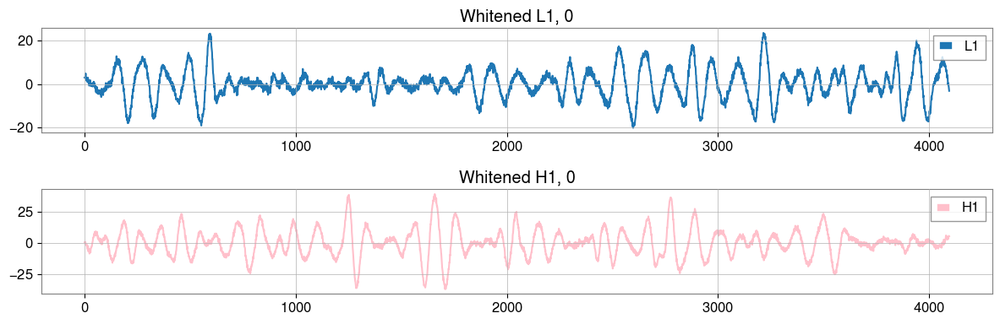

torch.Size([1, 2, 4096])


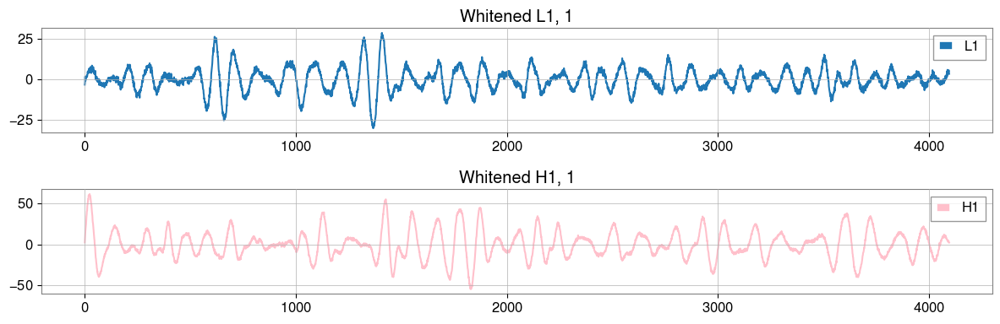

torch.Size([1, 2, 4096])


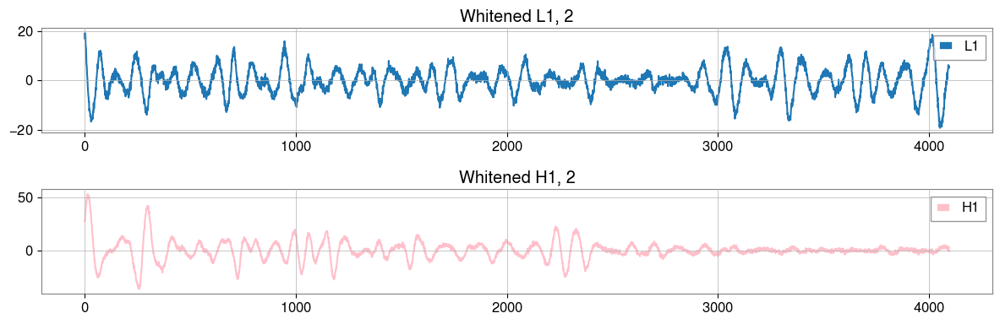

torch.Size([1, 2, 4096])


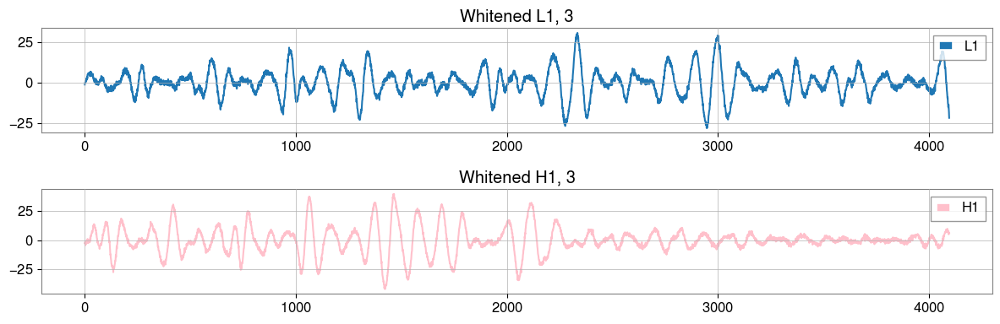

torch.Size([1, 2, 4096])


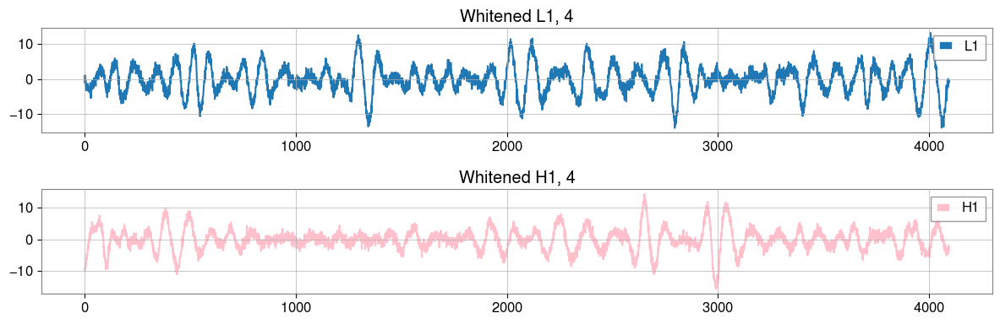

torch.Size([1, 2, 4096])


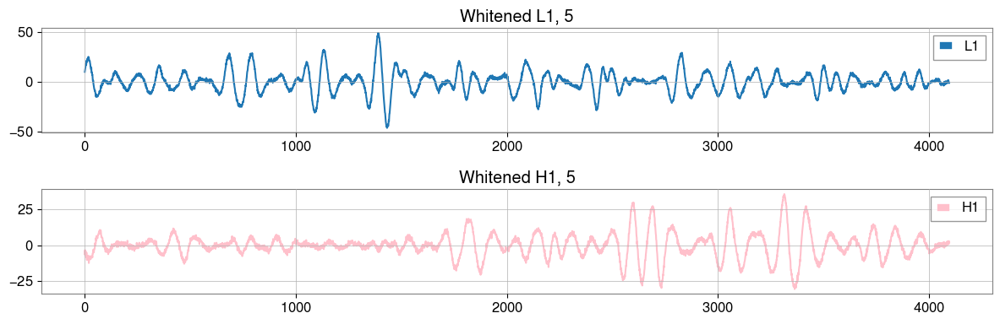

torch.Size([1, 2, 4096])


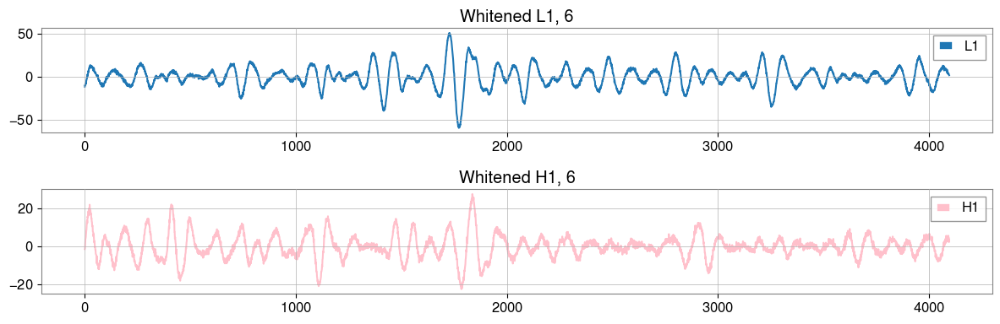

torch.Size([1, 2, 4096])


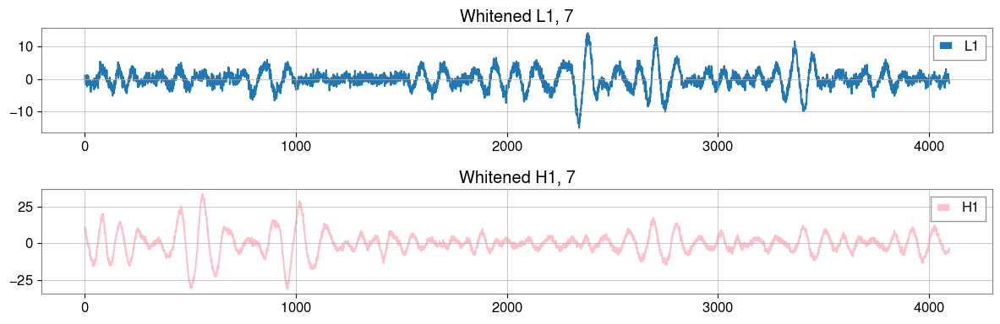

torch.Size([1, 2, 4096])


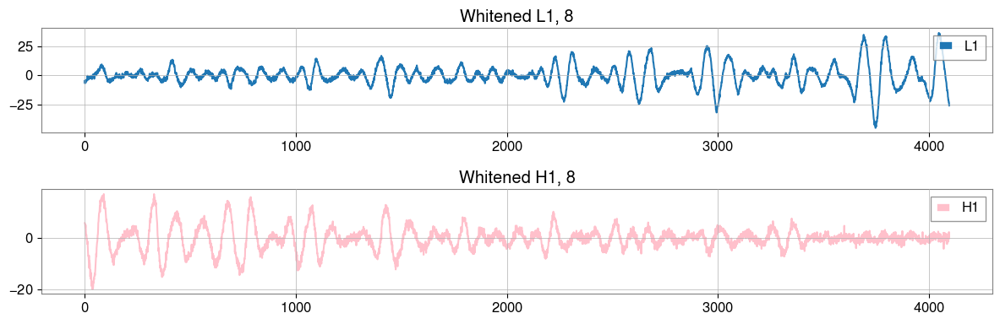

torch.Size([1, 2, 4096])


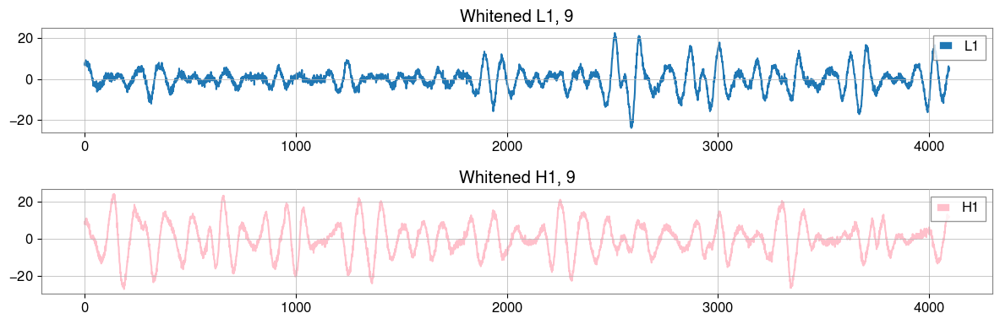

torch.Size([1, 2, 4096])


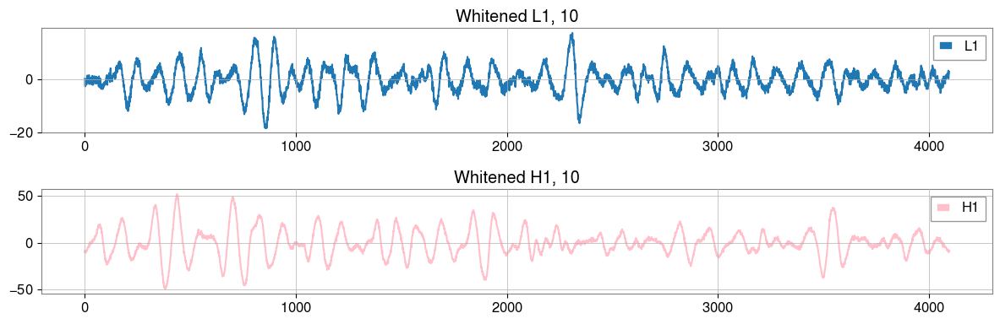

torch.Size([1, 2, 4096])


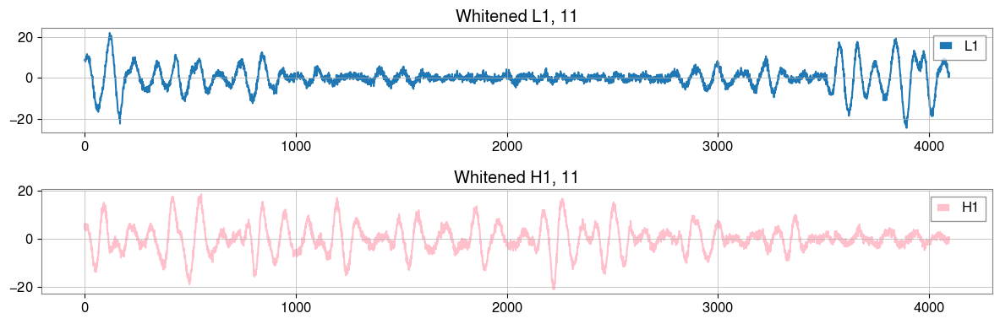

torch.Size([1, 2, 4096])


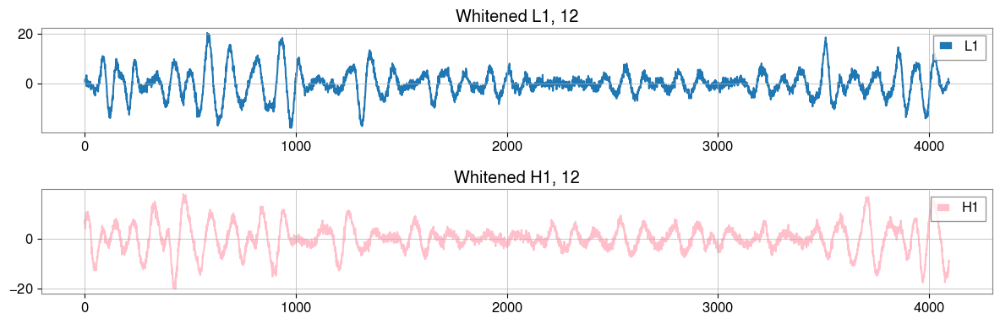

torch.Size([1, 2, 4096])


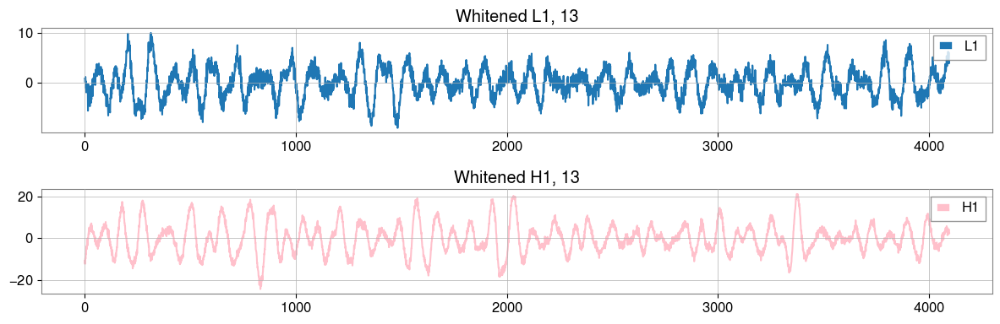

torch.Size([1, 2, 4096])


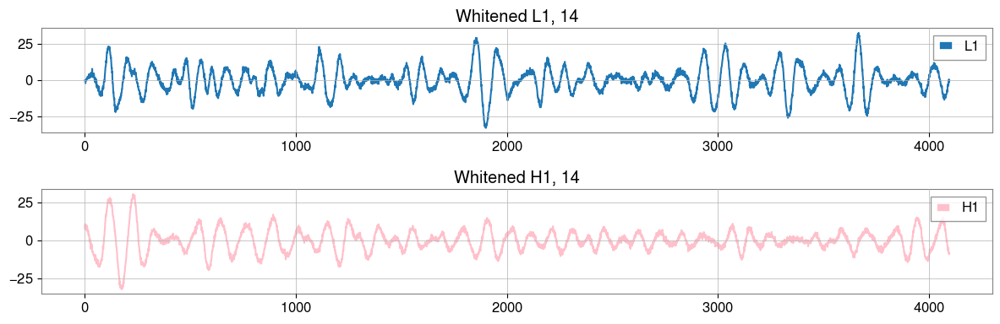

torch.Size([1, 2, 4096])


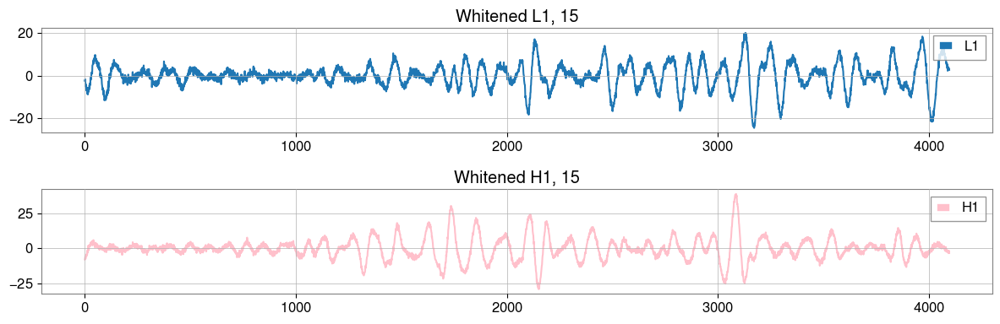

torch.Size([1, 2, 4096])


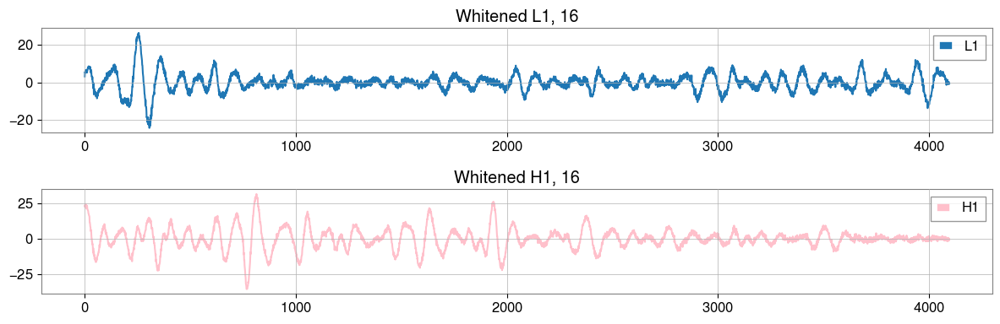

torch.Size([1, 2, 4096])


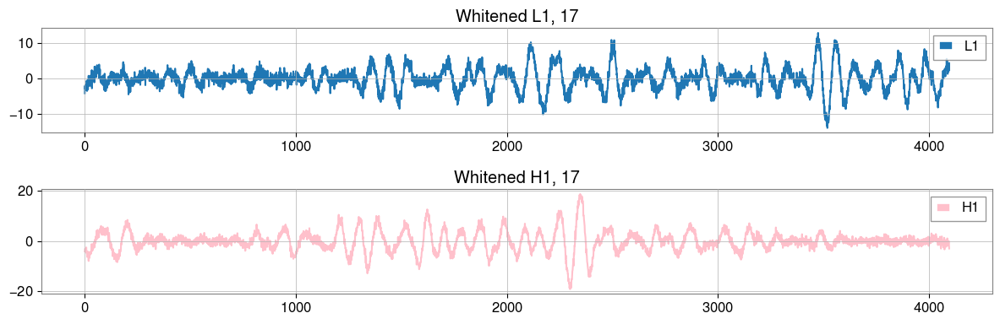

torch.Size([1, 2, 4096])


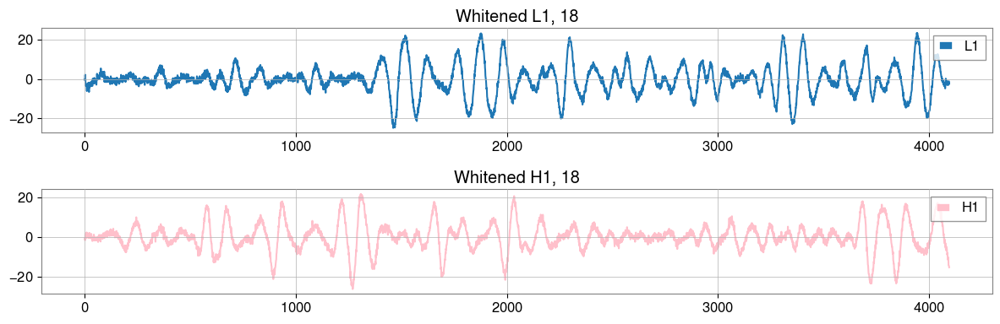

torch.Size([1, 2, 4096])


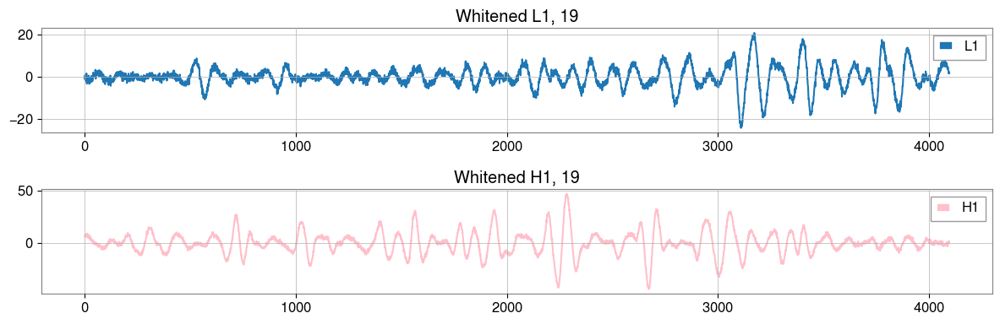

torch.Size([1, 2, 4096])


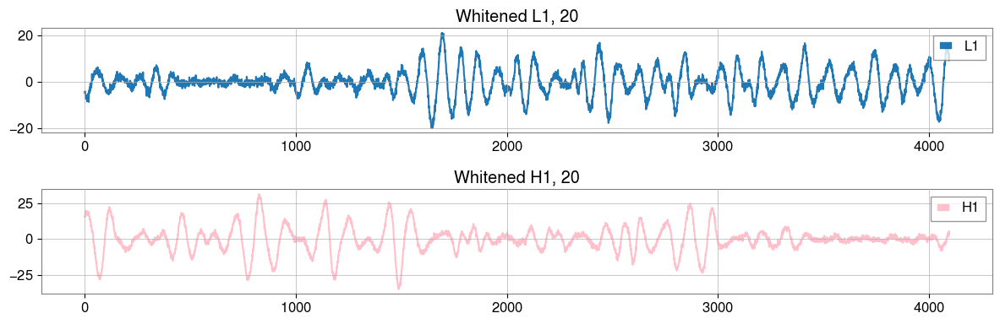

torch.Size([1, 2, 4096])


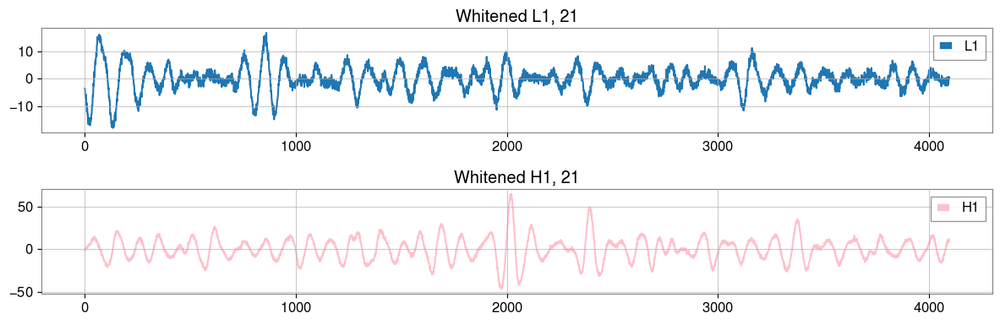

torch.Size([1, 2, 4096])


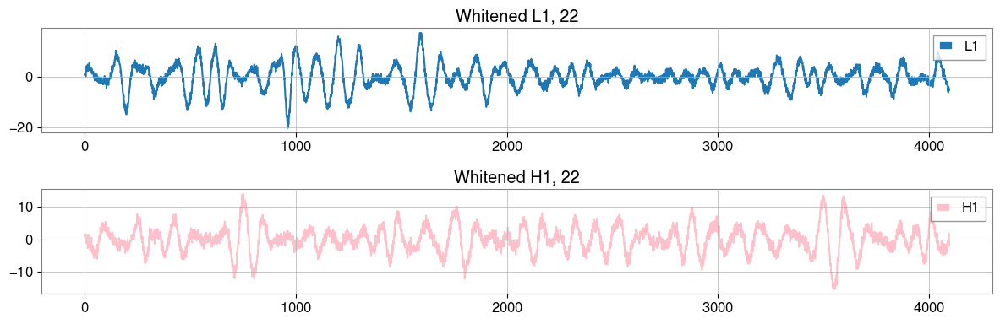

torch.Size([1, 2, 4096])


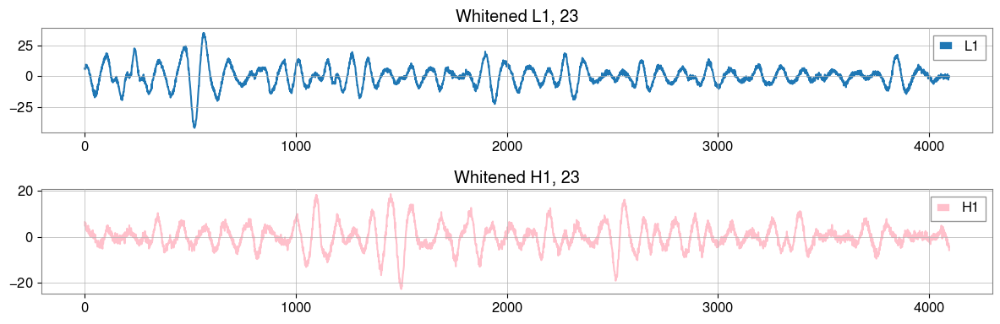

torch.Size([1, 2, 4096])


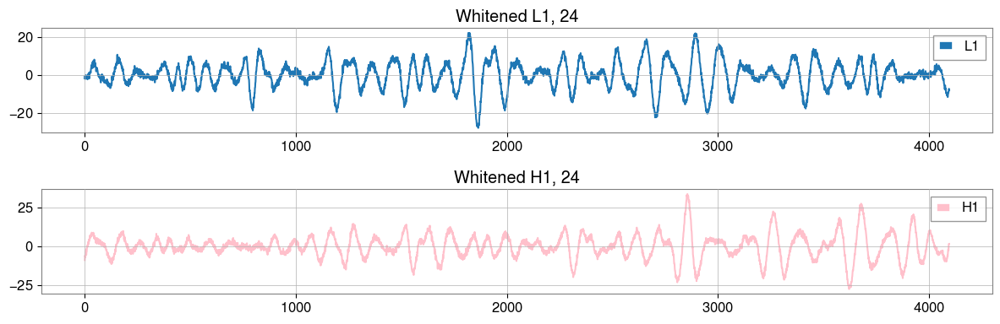

torch.Size([1, 2, 4096])


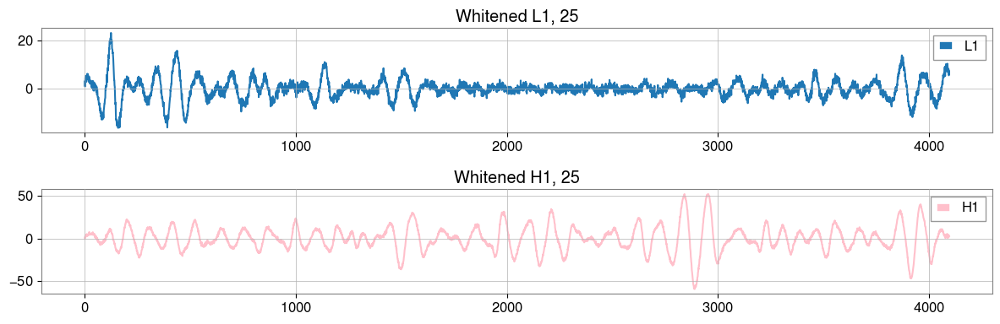

torch.Size([1, 2, 4096])


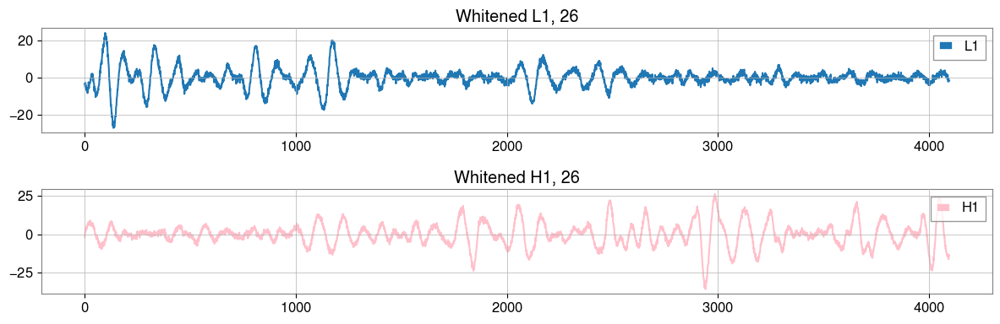

torch.Size([1, 2, 4096])


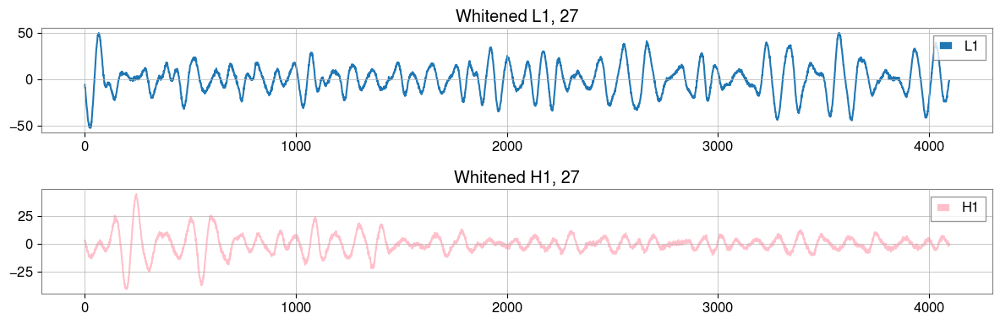

torch.Size([1, 2, 4096])


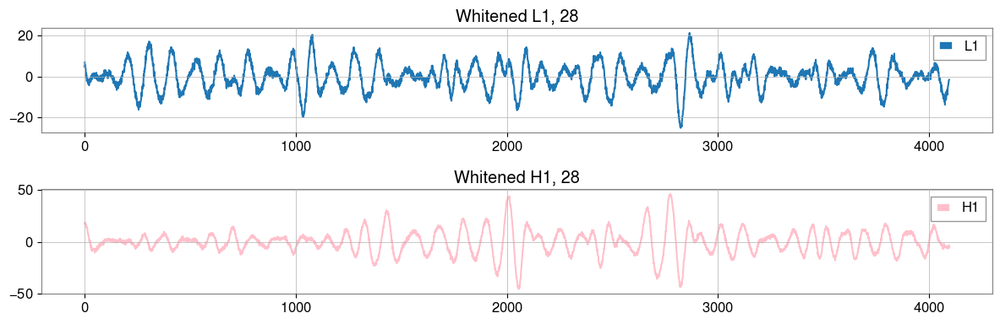

torch.Size([1, 2, 4096])


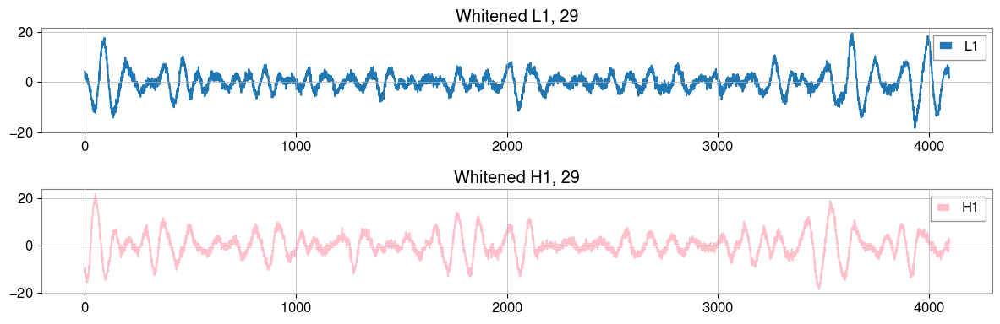

torch.Size([1, 2, 4096])


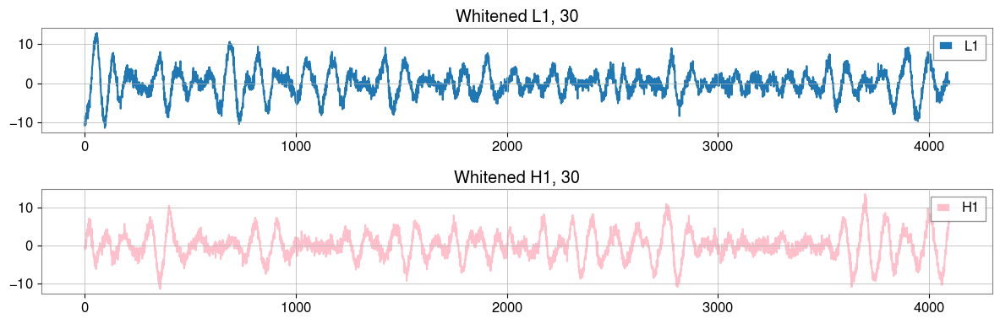

torch.Size([1, 2, 4096])


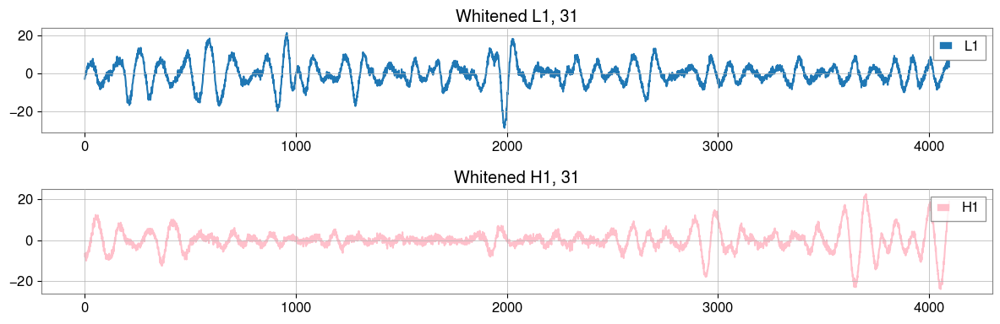

torch.Size([1, 2, 4096])


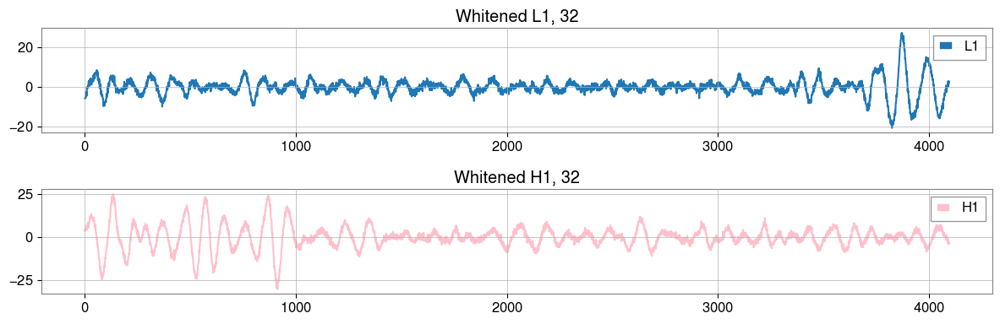

torch.Size([1, 2, 4096])


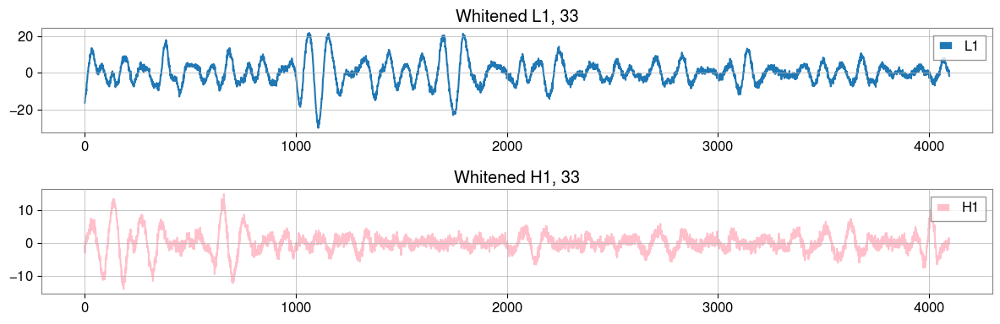

torch.Size([1, 2, 4096])


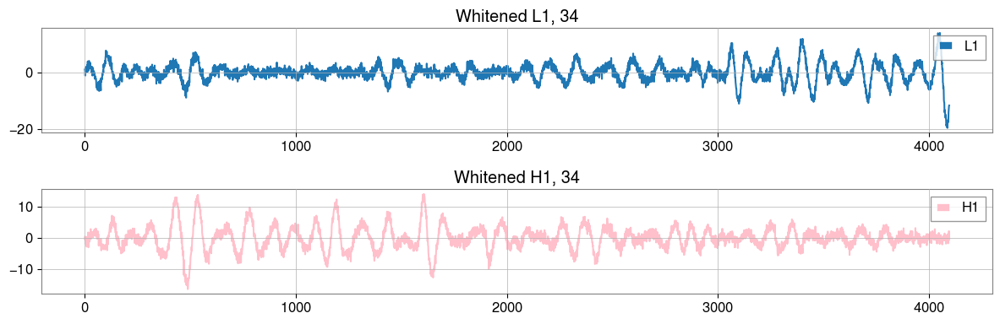

torch.Size([1, 2, 4096])


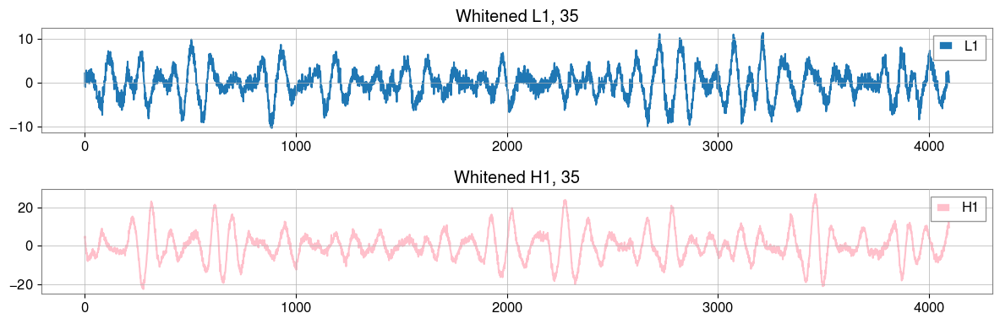

torch.Size([1, 2, 4096])


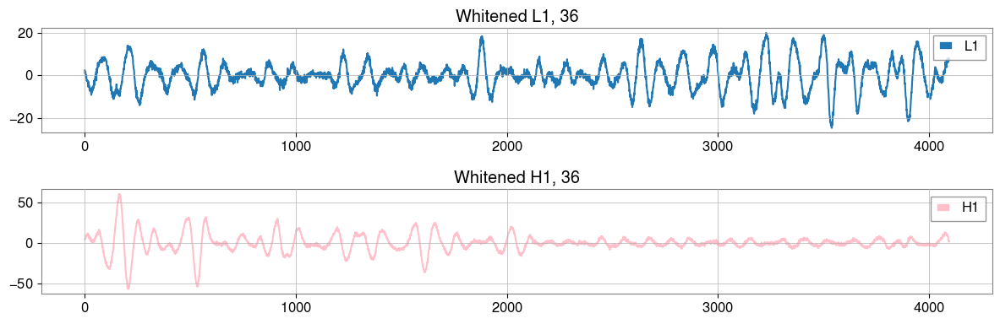

torch.Size([1, 2, 4096])


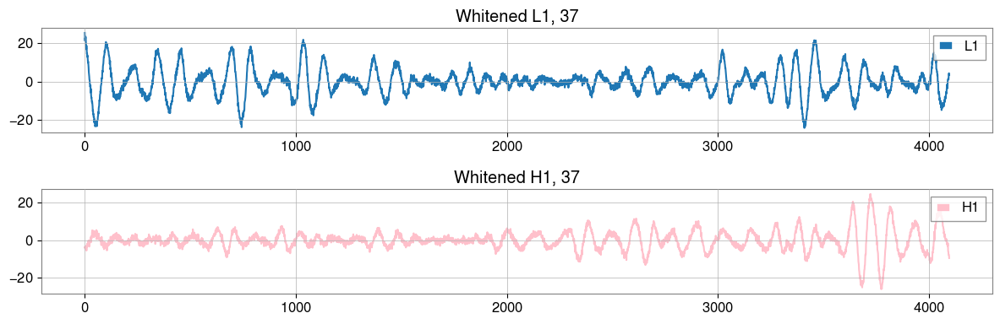

torch.Size([1, 2, 4096])


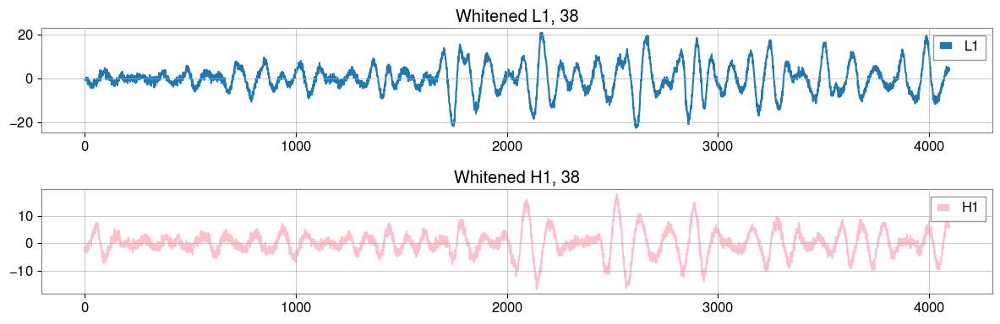

torch.Size([1, 2, 4096])


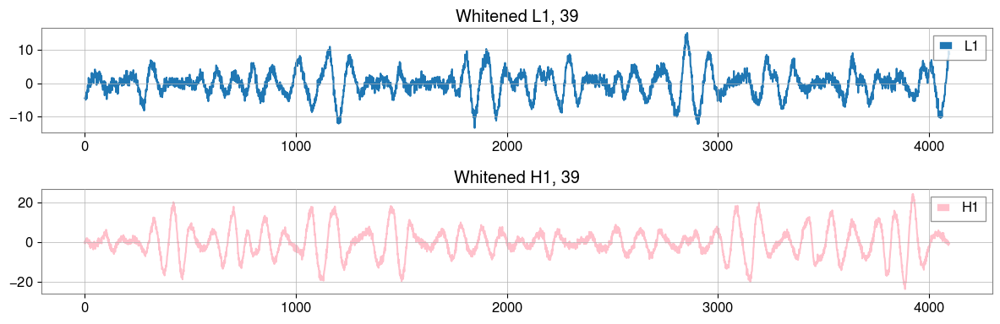

torch.Size([1, 2, 4096])


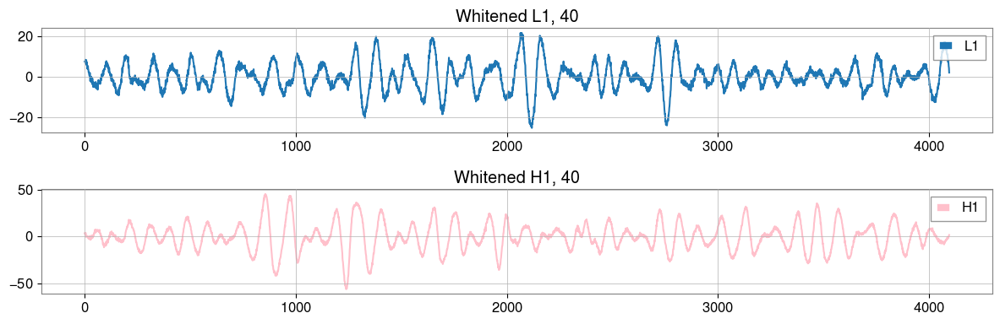

torch.Size([1, 2, 4096])


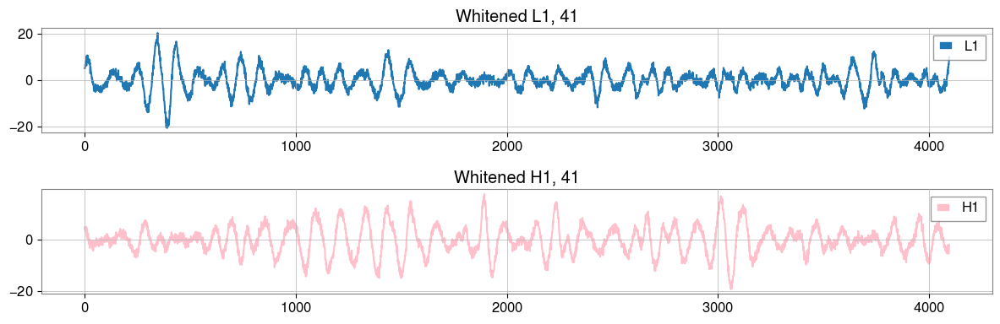

torch.Size([1, 2, 4096])


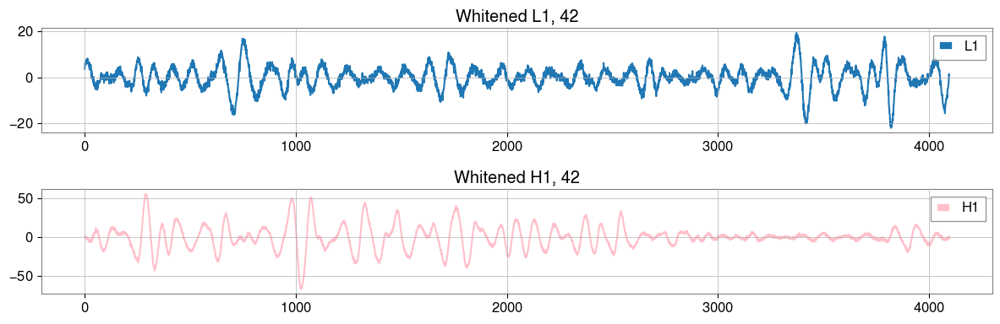

torch.Size([1, 2, 4096])


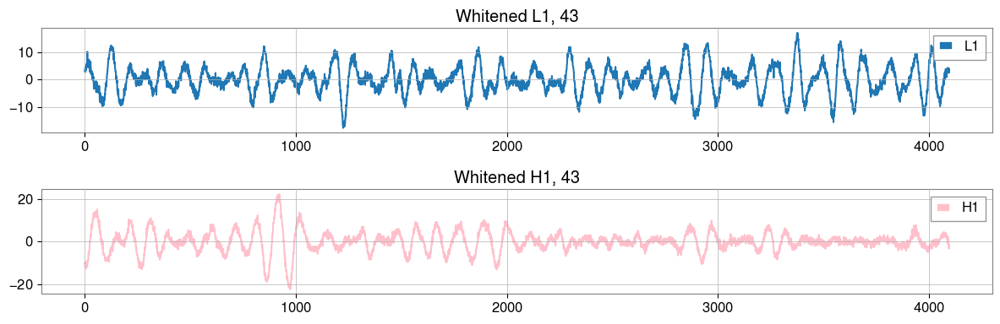

torch.Size([1, 2, 4096])


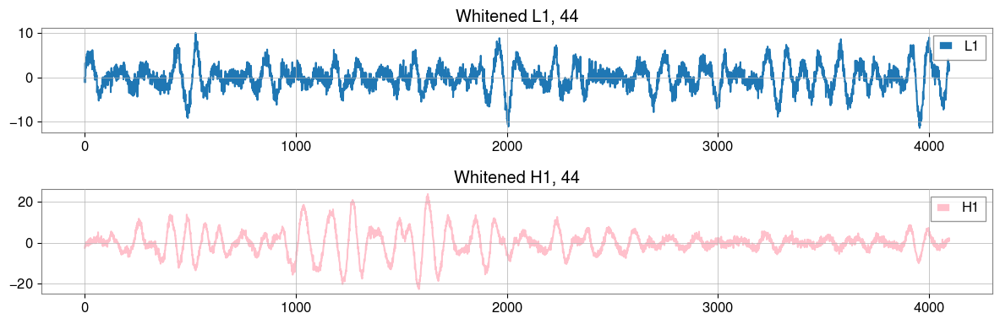

torch.Size([1, 2, 4096])


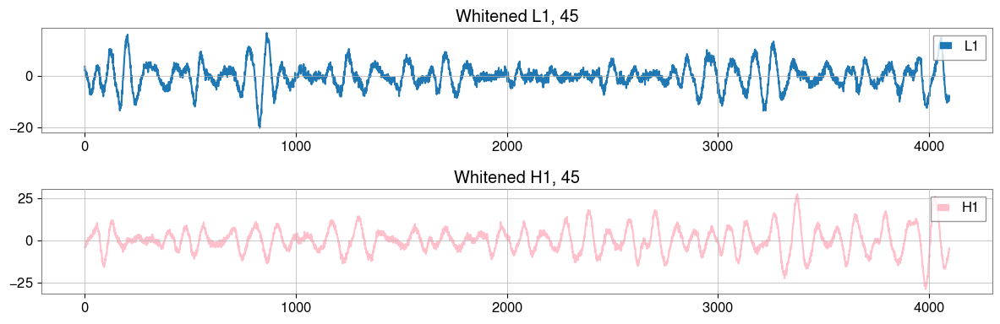

torch.Size([1, 2, 4096])


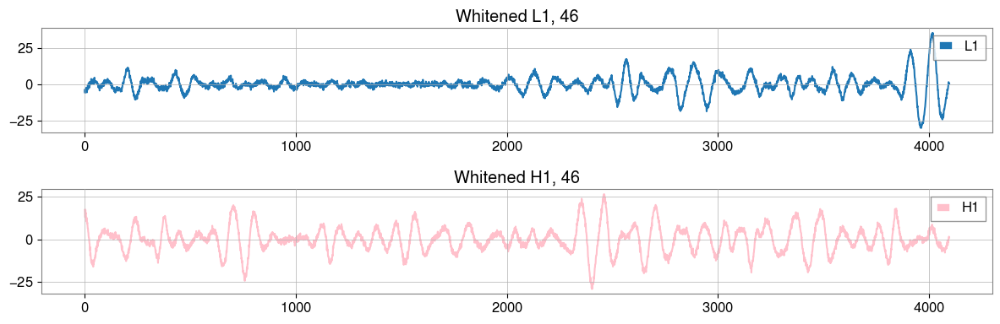

torch.Size([1, 2, 4096])


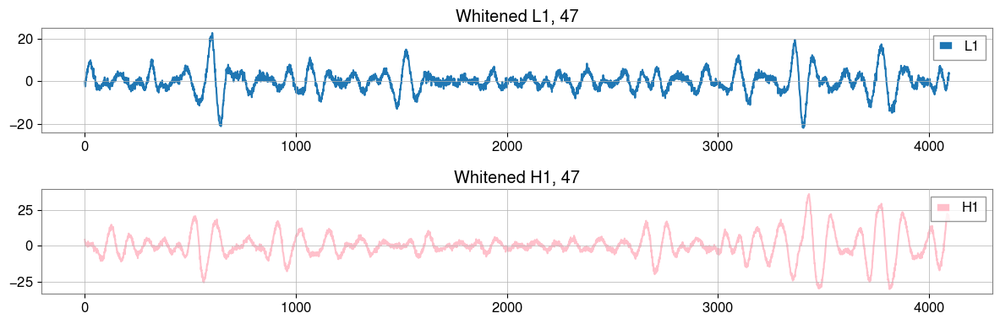

torch.Size([1, 2, 4096])


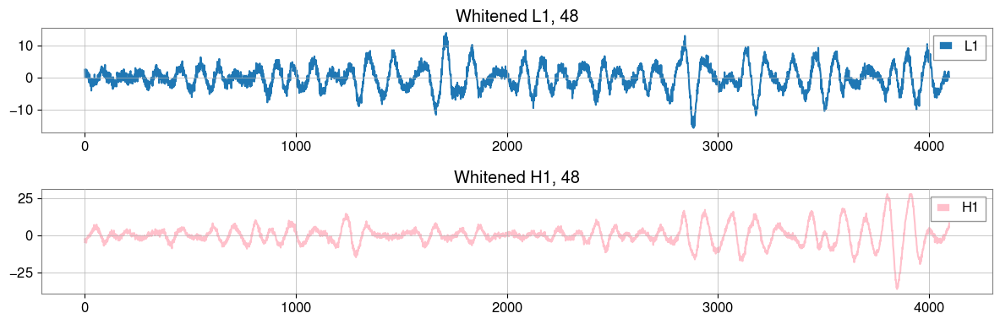

torch.Size([1, 2, 4096])


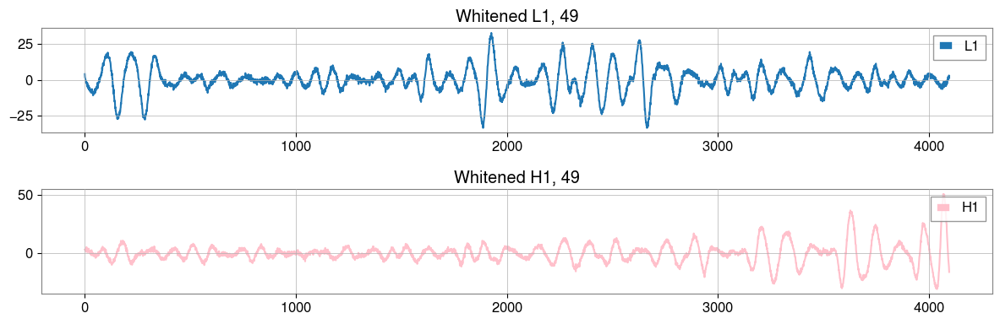

torch.Size([1, 2, 4096])


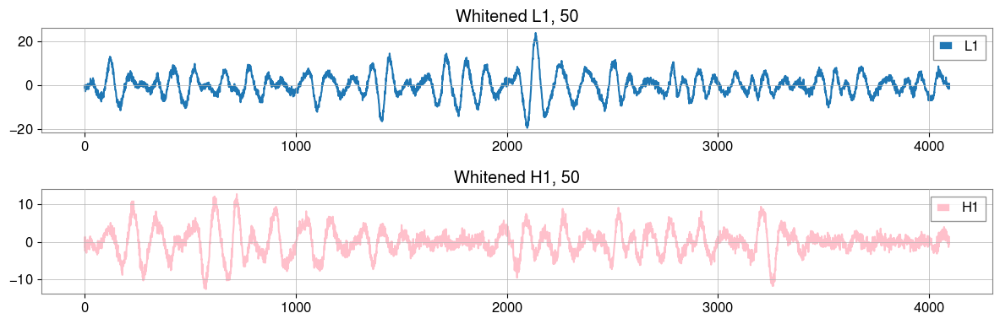

torch.Size([1, 2, 4096])


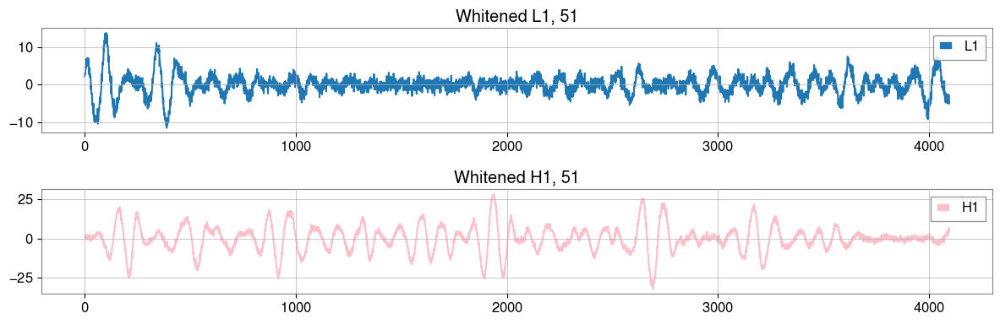

torch.Size([1, 2, 4096])


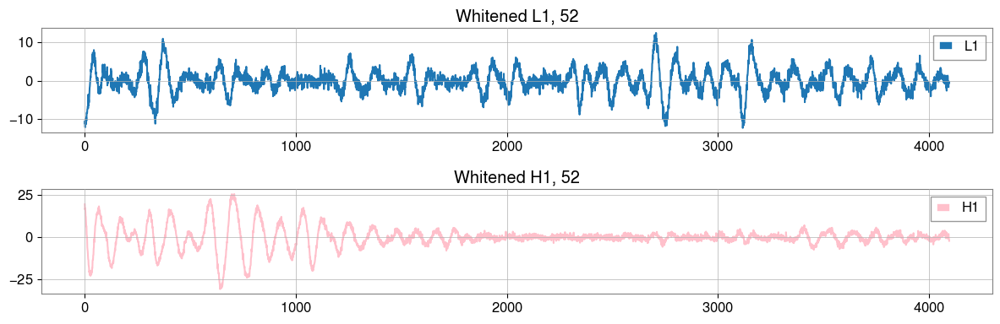

torch.Size([1, 2, 4096])


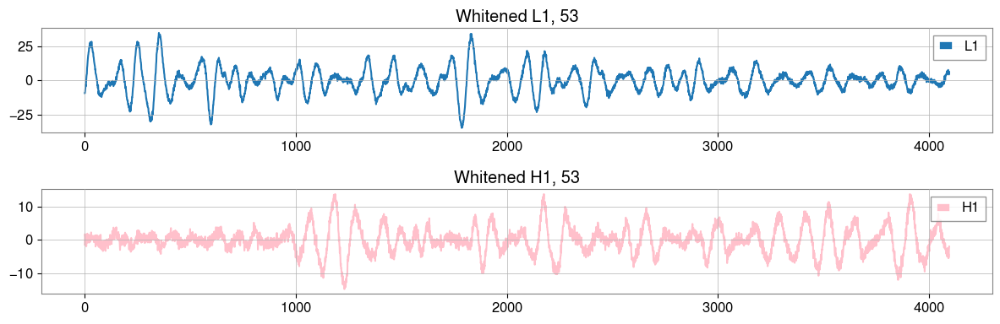

torch.Size([1, 2, 4096])


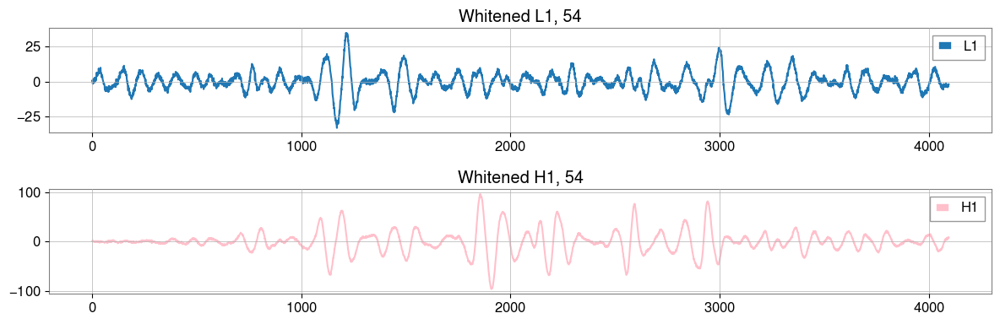

torch.Size([1, 2, 4096])


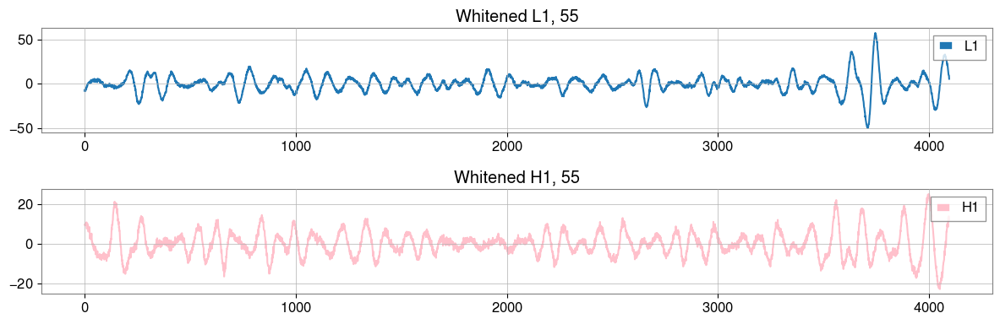

torch.Size([1, 2, 4096])


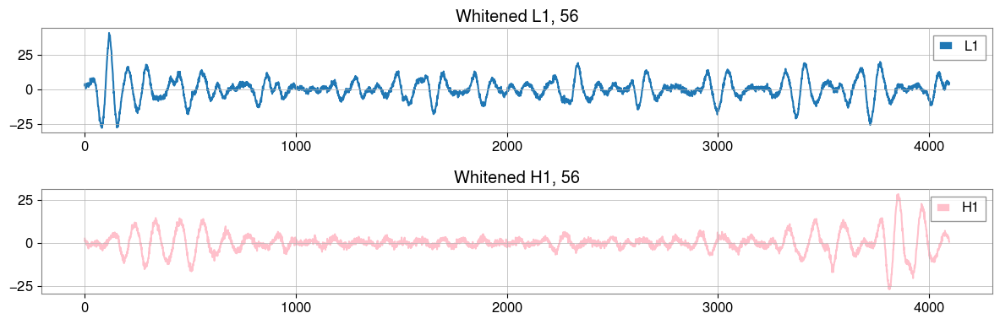

torch.Size([1, 2, 4096])


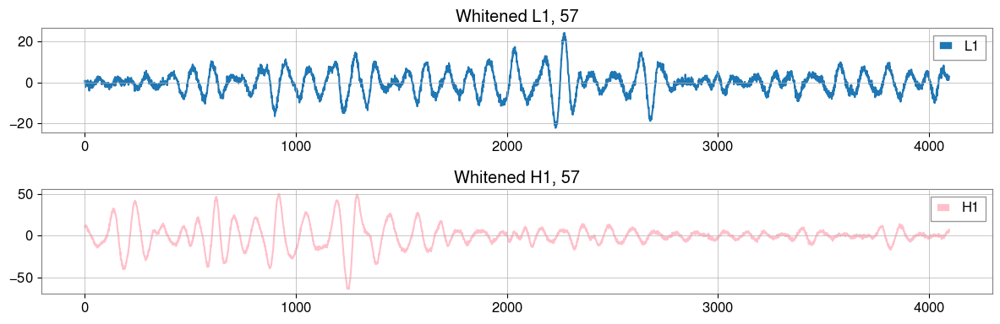

torch.Size([1, 2, 4096])


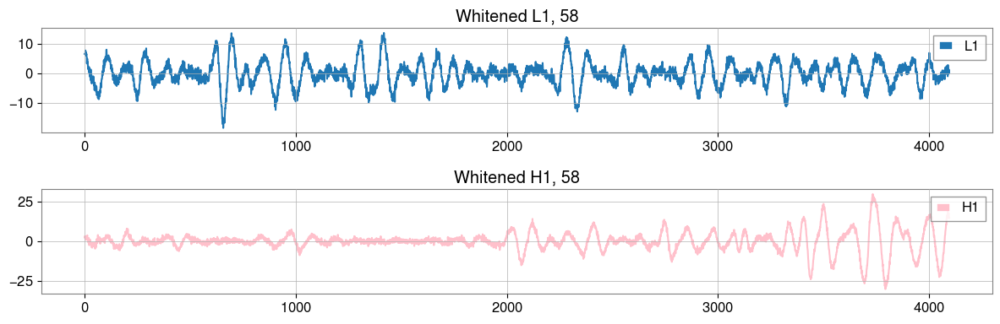

torch.Size([1, 2, 4096])


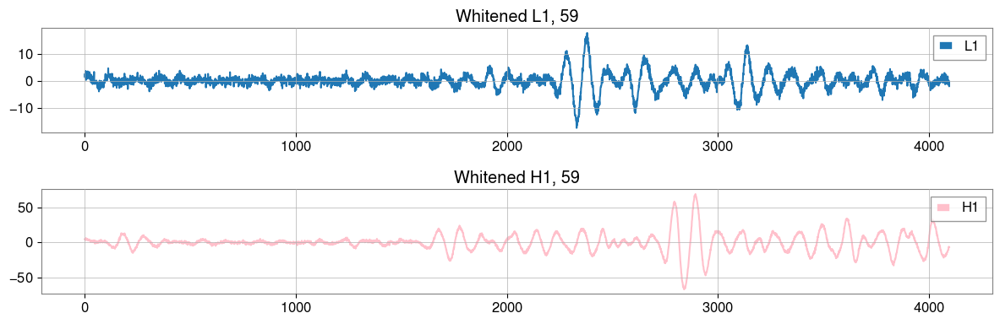

IndexError: index 60 is out of bounds for dimension 0 with size 60

In [126]:
for i in range(0, 61):
    psd_data = torch.Tensor(np.array(clean_batch[i,:,:64*4096].reshape((1,2,-1)))).to('cuda')
    batch = torch.Tensor(np.array(clean_batch[i,:,64*4096:].reshape((1,2,-1)))).to('cuda')
    batch = bandpass_filter(batch)
    
    whitener = Whiten(
        fduration=2,
        sample_rate=SAMPLE_RATE,
        # highpass=HIGHPASS,
    )
    whitener = whitener.to('cuda') if torch.cuda.is_available() else whitener

    # psd estimator
    # takes tensor of shape (batch_size, num_ifos, psd_length)
    spectral_density = SpectralDensity(
        sample_rate=SAMPLE_RATE,
        fftlength=FFTLENGTH,
        overlap=1,
    )

    spectral_density = spectral_density.to('cuda') if torch.cuda.is_available() else spectral_density

    # calculate psds
    psds = spectral_density(psd_data.double())
    whitened = whitener(batch.double(), psds.double())
    print(whitened.shape)
    plt.figure(figsize=(12, 4))
    
    # First subplot: L1
    plt.subplot(2, 1, 1)
    plt.plot(whitened[0, 0,:].detach().cpu(), label="L1")
    plt.legend(loc="upper right")
    plt.title(f"Whitened L1, {i}")
    
    # Second subplot: H1
    plt.subplot(2, 1, 2)
    plt.plot(whitened[0, 1, :].detach().cpu(), label="H1", color="pink")
    plt.legend(loc="upper right")
    plt.title(f"Whitened H1, {i}")
    
    plt.tight_layout()
    plt.show()

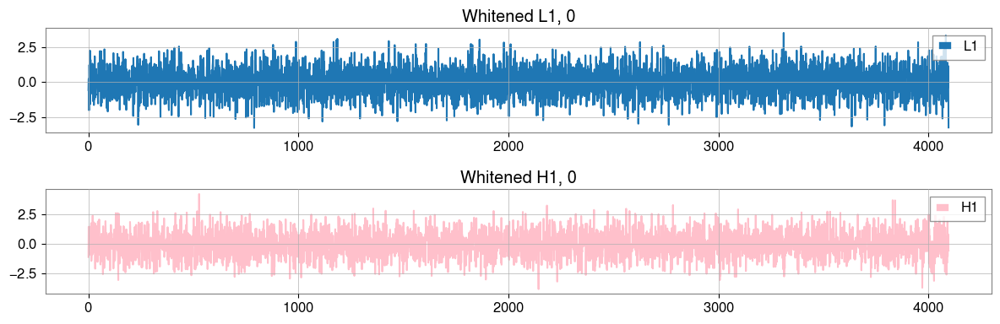

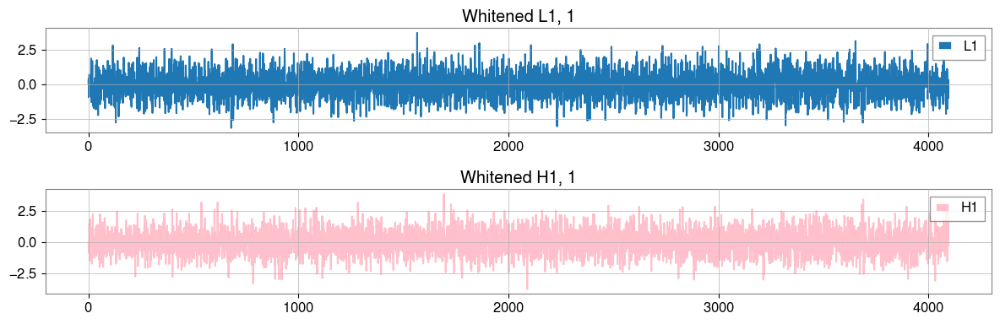

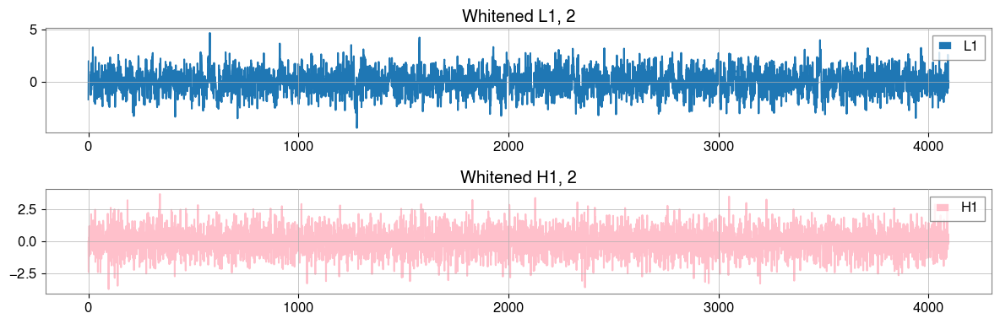

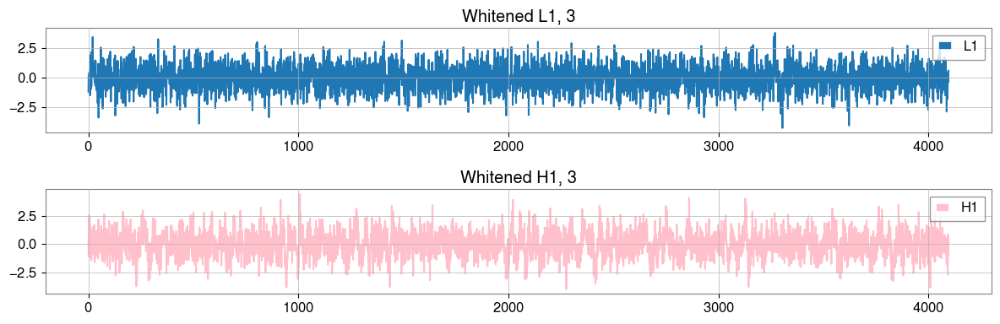

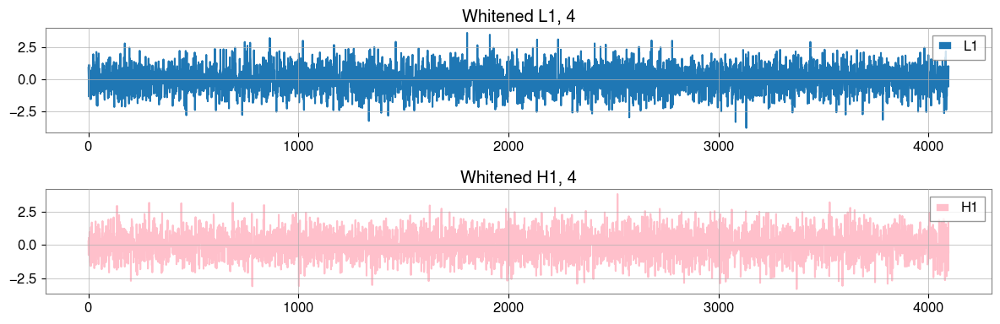

...

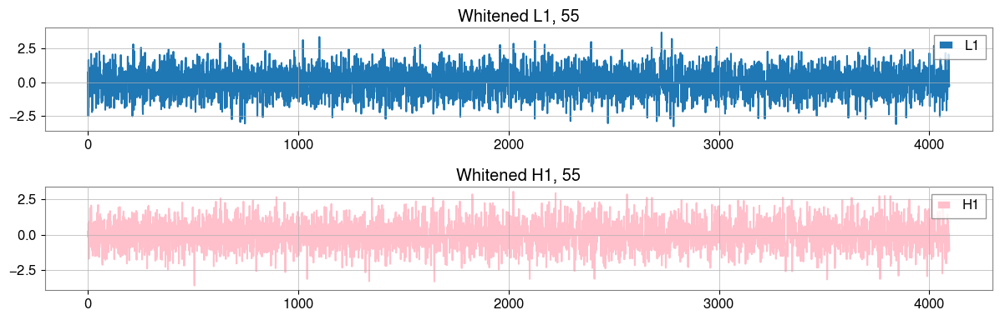

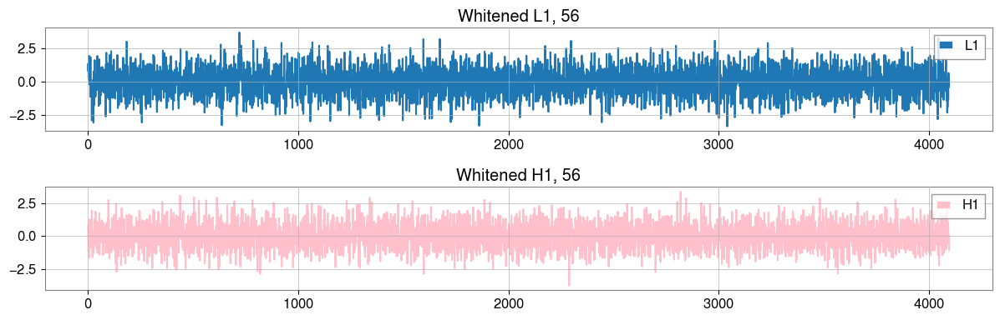

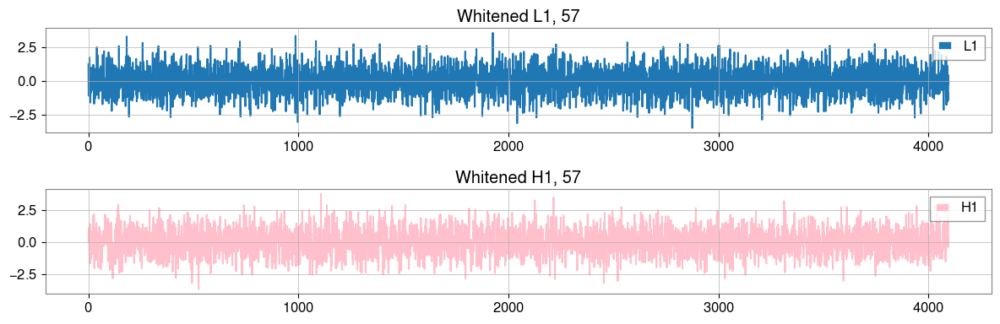

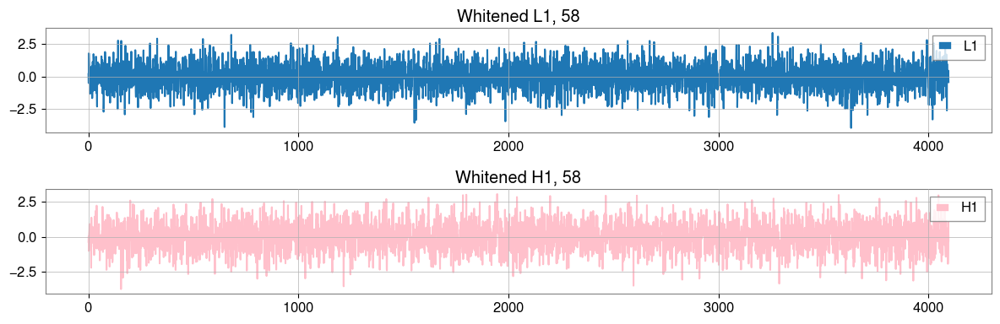

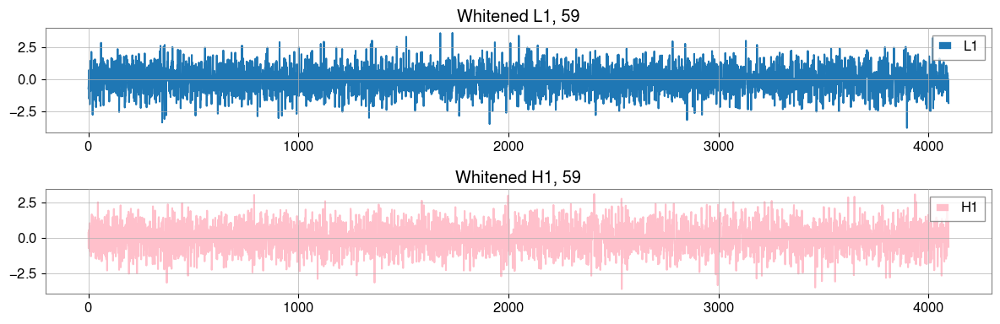

IndexError: index 60 is out of bounds for dimension 0 with size 60

In [100]:

for i in range(0, 61):
    # psd_data_h1 = torch.Tensor(np.array(seg_data[(i):(64+i),0,:].reshape((1,1,-1)))).to('cuda')
    # batch_h1 = torch.Tensor(np.array(seg_data[(64+i):(67+i),0,:].reshape((1,1,-1)))).to('cuda')

    # psd_data_l1 = torch.Tensor(np.array(seg_data[(i):(64+i),1,:].reshape((1,1,-1)))).to('cuda')
    # batch_l1 = torch.Tensor(np.array(seg_data[(64+i):(67+i),1,:].reshape((1,1,-1)))).to('cuda')

    psd_data_h1 = torch.Tensor(np.array(clean_batch[i,0,:64*4096].reshape((1,1,-1)))).to('cuda')
    batch_h1 = torch.Tensor(np.array(clean_batch[i,0,64*4096:].reshape((1,1,-1)))).to('cuda')

    psd_data_l1 = torch.Tensor(np.array(clean_batch[i,1,:64*4096].reshape((1,1,-1)))).to('cuda')
    batch_l1 = torch.Tensor(np.array(clean_batch[i,1,64*4096:].reshape((1,1,-1)))).to('cuda')
    

    whitener = Whiten(
        fduration=2,
        sample_rate=SAMPLE_RATE,
        highpass=HIGHPASS,
    )
    whitener = whitener.to('cuda') if torch.cuda.is_available() else whitener

    # psd estimator
    # takes tensor of shape (batch_size, num_ifos, psd_length)
    spectral_density = SpectralDensity(
        sample_rate=SAMPLE_RATE,
        fftlength=FFTLENGTH,
        overlap=1,
    )

    spectral_density = spectral_density.to('cuda') if torch.cuda.is_available() else spectral_density

    # calculate psds
    psds_h1 = spectral_density(psd_data_h1.double())
    psds_l1 = spectral_density(psd_data_l1.double())

    whitened_h1 = whitener(batch_h1.double(), psds_h1.double())
    whitened_l1 = whitener(batch_l1.double(), psds_l1.double())

    plt.figure(figsize=(12, 4))
    
    # First subplot: L1
    plt.subplot(2, 1, 1)
    plt.plot(whitened_l1[0, 0].detach().cpu(), label="L1")
    plt.legend(loc="upper right")
    plt.title(f"Whitened L1, {i}")
    
    # Second subplot: H1
    plt.subplot(2, 1, 2)
    plt.plot(whitened_h1[0, 0].detach().cpu(), label="H1", color="pink")
    plt.legend(loc="upper right")
    plt.title(f"Whitened H1, {i}")
    
    plt.tight_layout()
    plt.show()

In [123]:
import h5py
import yaml
import logging
import argparse
import numpy as np
from math import ceil, floor
from pathlib import Path
from typing import Callable, List, Optional, Union

import wandb
import torch
import torch.nn.functional as F
from torch.utils.data import TensorDataset, IterableDataset, DataLoader
import lightning.pytorch as pl
from lightning.pytorch.loggers import WandbLogger
from torch.utils.data import random_split

import ml4gw
from ml4gw.dataloading import Hdf5TimeSeriesDataset
from ml4gw.transforms import SpectralDensity, Whiten, SnrRescaler, SnrRescaler_Online
from ml4gw.gw import compute_observed_strain, get_ifo_geometry, compute_network_snr

from torch.distributions.uniform import Uniform
from torch.distributions import TransformedDistribution, Distribution
from ml4gw.distributions import Cosine, PowerLaw, LogNormal, LogUniform
from ml4gw.waveforms import GenerateString
from gwak import data
from gwak.data.prior import FakeGlitchPrior
from abc import ABC
import copy
import sys

import threading
from queue import Queue
import time

from typing import Union

import torch
from scipy.signal import iirfilter
from torchaudio.functional import filtfilt

class IIRFilter(torch.nn.Module):
    """
    IIR digital and analog filter design given order and critical points.
    Design an Nth-order digital or analog filter and apply it to a signal.
    Uses SciPy's ``iirfilter`` function to create the filter coefficients.
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iirfilter.html

    The forward call of this module accepts a batch tensor of shape
    (n_waveforms, n_samples) and returns the filtered waveforms.

    Args:
        N:
            The order of the filter.
        Wn:
            A scalar or length-2 sequence giving the critical frequencies.
            For digital filters, Wn are in the same units as fs. By
            default, fs is 2 half-cycles/sample, so these are normalized
            from 0 to 1, where 1 is the Nyquist frequency. (Wn is thus in
            half-cycles / sample). For analog filters, Wn is an angular
            frequency (e.g., rad/s). When Wn is a length-2 sequence,``Wn[0]``
            must be less than ``Wn[1]``.
        rp:
            For Chebyshev and elliptic filters, provides the maximum ripple in
            the passband. (dB)
        rs:
            For Chebyshev and elliptic filters, provides the minimum
            attenuation in the stop band. (dB)
        btype:
            The type of filter. Default is 'bandpass'.
        analog:
            When True, return an analog filter, otherwise a digital filter
            is returned.
        ftype:
            The type of IIR filter to design:

                - Butterworth   : 'butter'
                - Chebyshev I   : 'cheby1'
                - Chebyshev II  : 'cheby2'
                - Cauer/elliptic: 'ellip'
                - Bessel/Thomson: 'bessel's
        fs:
            The sampling frequency of the digital system.

    Returns:
        Filtered signal on the forward pass.
    """  # noqa: E501

    def __init__(
        self,
        N: int,
        Wn: Union[float, torch.Tensor],
        rs: Union[None, float, torch.Tensor] = None,
        rp: Union[None, float, torch.Tensor] = None,
        btype="band",
        analog=False,
        ftype="butter",
        fs=None,
    ) -> None:
        super().__init__()

        if isinstance(Wn, torch.Tensor):
            Wn = Wn.numpy()
        if isinstance(rs, torch.Tensor):
            rs = rs.numpy()
        if isinstance(rp, torch.Tensor):
            rp = rp.numpy()

        b, a = iirfilter(
            N,
            Wn,
            rs=rs,
            rp=rp,
            btype=btype,
            analog=analog,
            ftype=ftype,
            output="ba",
            fs=fs,
        )
        self.register_buffer("b", torch.tensor(b))
        self.register_buffer("a", torch.tensor(a))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        r"""
        Apply the filter to the input signal.

        Args:
            x:
                The input signal to be filtered.

        Returns:
            The filtered signal.
        """
        return filtfilt(x, self.a, self.b, clamp=False)

class GwakBaseDataloader(pl.LightningDataModule):

    def __init__(
        self,
        data_dir: Path,
        sample_rate: int,
        kernel_length: float, # how many data points
        psd_length: int, # for whitening
        fduration: int,
        fftlength: int,
        batch_size: int,
        batches_per_epoch: int,
        num_workers: int,
        glitch_root: Path = None,
        data_saving_file: Path = None,
        ifos: str = 'HL',
        remake_cache: bool = False, # whether to remake the glitch cache file for the h5s
    ):
        super().__init__()
        self.train_fnames, self.val_fnames, self.test_fnames = self.train_val_test_split(data_dir)
        self.sample_rate = sample_rate
        self.kernel_length = kernel_length
        self.psd_length = psd_length
        self.fduration = fduration
        self.fftlength = fftlength
        self.batch_size = batch_size
        self.batches_per_epoch = batches_per_epoch
        self.num_workers = num_workers
        self.glitch_root = glitch_root
        self.data_saving_file = data_saving_file
        self.remake_cache = remake_cache
        if type(ifos) == list:
            self.ifos = ifos
        else:
            self.ifos = [f'{ifo}1' for ifo in ifos]
            if self.ifos not in [['H1', 'L1'], ['H1', 'V1'], ['L1', 'V1'], ['H1', 'L1', 'V1']]:
                print(f"Unrecognized ifo configuration {self.ifos}, please specify a valid one")
                sys.exit(1)
        print("ifos are", self.ifos)
        print("data dir is", data_dir)

        if self.data_saving_file is not None:
            Path(self.data_saving_file.parents[0]).mkdir(parents=True, exist_ok=True)
            self.data_group = h5py.File(self.data_saving_file, "w")

        self._logger = self.get_logger()

        # define a config dictionary that we can manipulate downstream for signal-specific kwargs
        # to be used for e.g. additional kwargs for each signal type needed for waveform generation
        self.config = {
            "sample_rate": sample_rate,
            "kernel_length": kernel_length,
            "psd_length": psd_length,
            "fduration": fduration,
            "fftlength": fftlength,
        }

    def train_val_test_split(self, data_dir, val_split=0.1, test_split=0.1):
        all_files = list(Path(data_dir).glob('*.h5')) + list(Path(data_dir).glob('*.hdf5'))
        all_files = sorted(all_files)
        n_all_files = len(all_files)
        # adding handling for the case where data_dir has subdirs for train/test/val
        if n_all_files == 0:
            subdirs = list(Path(data_dir).glob('*'))
            train, test, val = None, None, None
            for subdir in subdirs:
                subdir_files = list(subdir.glob('*.h5')) + list(subdir.glob('*.hdf5'))
                if subdir.stem == 'train':
                    train = subdir_files
                elif subdir.stem == 'test':
                    test = subdir_files
                elif subdir.stem == 'val':
                    val = subdir_files
            if train is None:
                print("You passed a directory with no h5 files and no train/ subdir!")
                sys.exit(1)
            elif test is None and val is None:
                print("You passed a directory with no test/ or val/ subdir!")
                sys.exit(1)
            elif test is None and val is not None:
                print("You passed a directory with a val/ directory but no test/, setting test set = val set")
                test = val
            elif test is not None and val is None:
                print("You passed a directory with a test/ directory but no val/, setting val set = test set")
                val = test
            return train, val, test
        else:
            n_train_files = int(n_all_files * (1 - val_split - test_split))
            n_val_files = int(n_all_files * val_split)
            return all_files[:n_train_files], all_files[n_train_files:n_train_files+n_val_files], all_files[n_train_files+n_val_files:]


    def train_dataloader(self):

        dataset = Hdf5TimeSeriesDataset(
                self.train_fnames,
                channels=self.ifos,
                kernel_length=self.kernel_length,
                fduration=self.fduration,
                psd_length=self.psd_length,
                sample_rate=self.sample_rate,
                batch_size=self.batch_size,
                batches_per_epoch=self.batches_per_epoch,
                coincident=False,
                mode='clean',
                glitch_root=self.glitch_root,
                ifos=self.ifos,
                remake_cache=self.remake_cache
            )
        dataloader = torch.utils.data.DataLoader(
            dataset, num_workers=self.num_workers, pin_memory=False
        )
        return dataloader

    def val_dataloader(self):

        dataset = Hdf5TimeSeriesDataset(
            self.val_fnames,
            channels=self.ifos,
            kernel_length=self.kernel_length,
            fduration=self.fduration,
            psd_length=self.psd_length,
            sample_rate=self.sample_rate,
            batch_size=self.batch_size,
            batches_per_epoch=self.batches_per_epoch,
            coincident=False,
            mode='clean',
            glitch_root=self.glitch_root,
            ifos=self.ifos,
            remake_cache=self.remake_cache
        )
        dataloader = torch.utils.data.DataLoader(
            dataset, num_workers=self.num_workers, pin_memory=False
        )

        return dataloader

    def test_dataloader(self):
        dataset = Hdf5TimeSeriesDataset(
            self.test_fnames,
            channels=self.ifos,
            kernel_length=self.kernel_length,
            fduration=self.fduration,
            psd_length=self.psd_length,
            sample_rate=self.sample_rate,
            batch_size=self.batch_size,
            batches_per_epoch=self.batches_per_epoch,
            coincident=False,
            mode='clean',
            glitch_root=self.glitch_root,
            ifos=self.ifos,
            remake_cache=self.remake_cache
        )
        dataloader = torch.utils.data.DataLoader(
            dataset, num_workers=self.num_workers, pin_memory=False
        )
        return dataloader

    def get_logger(self):
        logger_name = 'GwakBaseDataloader'
        logger = logging.getLogger(logger_name)
        logger.setLevel(logging.INFO)
        return logger

    def whiten(self, batch):

        # split batch into psd data and data to be whitened
        split_size = int((self.kernel_length + self.fduration) * self.sample_rate)
        splits = [batch.size(-1) - split_size, split_size]
        psd_data, batch = torch.split(batch, splits, dim=-1)

        # psd estimator
        # takes tensor of shape (batch_size, num_ifos, psd_length)
        spectral_density = SpectralDensity(
            self.sample_rate,
            self.fftlength,
            overlap=1,
        )
        spectral_density = spectral_density.to('cuda') if torch.cuda.is_available() else spectral_density

        # calculate psds
        psds = spectral_density(psd_data.double())

        # create whitener
        whitener = Whiten(
            self.fduration,
            self.sample_rate,
            highpass = 30,
        )
        whitener = whitener.to('cuda') if torch.cuda.is_available() else whitener

        whitened = whitener(batch.double(), psds.double())

        # # normalize the input data
        # stds = torch.std(whitened, dim=-1, keepdim=True)
        # whitened = whitened / stds

        return whitened

    def on_after_batch_transfer(self, batch, dataloader_idx):

        if self.trainer.training or self.trainer.validating or self.trainer.sanity_checking:
            # unpack the batch
            [batch] = batch
            # inject waveforms; maybe also whiten data preprocess etc..
            batch = self.whiten(batch)

            if self.trainer.training and (self.data_saving_file is not None):

                step_name = f"Training/Step_{self.trainer.global_step:06d}_BK"
                self.data_group.create_dataset(step_name, data = batch.cpu())

            if self.trainer.validating and (self.data_saving_file is not None):

                step_name = f"Validation/Step_{self.trainer.global_validation_step:06d}_BK"
                self.data_group.create_dataset(step_name, data = batch.cpu())

            return batch

    def generate_waveforms(self, batch_size, parameters=None, ra=None, dec=None):
        pass

    def inject(self, batch, waveforms):
        pass


class SignalDataloader(GwakBaseDataloader):
    def __init__(
        self,
        signal_classes, # string names of signal class(es) desired
        priors, # priors for each class
        waveforms, # waveforms for each class
        extra_kwargs, # any additional kwargs a particular signal needs to generate waveforms (e.g. ringdown duration)
        cache_dir: Optional[str] = None,
        *args,

        loader_mode: str = "clean",
        fakeGlitch_types: Optional[List[str]] = None, # if we want to specify set of signals for fakeGlitch generation, otherwise use all available
        anneal_snr: bool = False, # whether to anneal the SNR of the generated waveforms (curriculum learning
        snr_prior: Union[TransformedDistribution,Distribution],
        snr_init_factor: float = 1.0, # initial multiplier for SNR if we are annealing it i.e. curriculum learning
        snr_anneal_epochs: float = 10, # number of epochs to anneal SNR over
        rebalance_classes: bool = True, # whether to rebalance the classes (e.g. waveforms with same label but different names)
        **kwargs
    ):
        super().__init__(*args, **kwargs)
        self.signal_classes = signal_classes if type(signal_classes) == list else [signal_classes]
        self.num_classes = len(signal_classes)
        self.waveforms = waveforms if type(waveforms) == list else [waveforms]
        self.priors = priors if type(priors) == list else [priors]
        self.extra_kwargs = extra_kwargs if type(extra_kwargs) == list else [extra_kwargs]
        self.loader_mode = loader_mode
        self.anneal_snr = anneal_snr
        self.snr_init_factor = snr_init_factor
        self.snr_anneal_epochs = snr_anneal_epochs
        self.has_glitch = "Glitch" in self.signal_classes
        self.cache_dir = cache_dir
        self.rebalance_classes = rebalance_classes

        self.all_signal_labels = {
            "SineGaussian":1,
            "BBH":2,
            "Gaussian":3,
            "Cusp":4,
            "Kink":4,
            "KinkKink":4,
            "WhiteNoiseBurst":5,
            "CCSN":6,
            "Background":7,
            "Glitch":7,
            "FakeGlitch":8,
            "MultiSineGaussian":9
        }
        self.all_signal_label_names = {
            1:"SineGaussian",
            2:"BBH",
            3:"Gaussian",
            4:"Strings (Cusp/Kink/2Kink)",
            5:"WhiteNoiseBurst",
            6:"CCSN",
            7:"Bkg/Glitch",
            8:"FakeGlitch",
            9:"MultiSineGaussian"
        }

        self.signal_configs = []
        for i in range(len(signal_classes)):
            signal_config = copy.deepcopy(self.config)
            if extra_kwargs[i] is not None:
                signal_config.update(extra_kwargs[i])
            self.signal_configs.append(signal_config)

        # Projection parameters
        self.ra_prior =  Uniform(0, 2*torch.pi)
        self.dec_prior = Cosine(-np.pi/2, torch.pi/2)
        self.phic_prior = Uniform(0, 2 * torch.pi)

        # # CCSN second-derivitive waveform data if using
        # file_path = Path(__file__).resolve()
        # self.ccsn_dict = load_h5_as_dict(
        #     chosen_signals=file_path.parents[1] / "data/configs/ccsn.yaml",
        #     source_file=Path(file_path.parents[2] / "gwak-dlc/Resampled/")
        # )
        # self.generate_waveforms_ccsn = CCSN_Injector(
        #     ifos=self.ifos,
        #     signals_dict=self.ccsn_dict,
        #     sample_rate=self.sample_rate,
        #     sample_duration=0.5,
        #     buffer_duration=2.5
        # )

        # compute number of events to generate per class per batch
        self.num_per_class = self.num_classes * [self.batch_size//self.num_classes]
        for i in range(self.batch_size % self.num_classes):
            self.num_per_class[i] += 1

        # new computation for when several classes have the same label (e.g. merging strings)
        if self.rebalance_classes:
            uniq,counts = np.unique([self.all_signal_labels[signal_class] for signal_class in self.signal_classes], return_counts=True)
            frac_per_label = 1.0/len(uniq)
            counts_per_label = {}
            for label,ct in zip(uniq,counts):
                frac = 1.0 / ct
                counts_per_label[label] = floor(frac*frac_per_label*self.batch_size)
            self.num_per_class = [counts_per_label[self.all_signal_labels[signal_class]] for signal_class in self.signal_classes]
            if np.sum(self.num_per_class) != self.batch_size:
                if np.sum(self.num_per_class) > self.batch_size:
                    extra = np.sum(self.num_per_class) - self.batch_size
                    for i in range(extra):
                        self.num_per_class[i] -= 1
                else:
                    deficit = self.batch_size - np.sum(self.num_per_class)
                    for i in range(deficit):
                        self.num_per_class[i] += 1

        # save correspondence between numerical labels and signal names
        # convention is label 1 = first signal, label 2 = second signal, etc.
        #class_labels = [i+1 for i in range(self.num_classes)]
        #if self.data_saving_file is not None:
        #    self.data_group.create_dataset("class_label_numbers",data=np.array(class_labels))
        #    self.data_group["class_label_names"] = self.signal_classes

        # make a list of signals we can use for "fake" glitch generation
        # i.e. where we populate one ifo with a signal and the other with nothing
        # use only signals for which waveforms/priors are easy
        if "FakeGlitch" in self.signal_classes:
            fakeGlitch_config = copy.deepcopy(self.config)
            fakeGlitch_config['ringdown_duration'] = 0.9 # need to set this by hand if there are BBHs included in fake glitch set
            self.fakeGlitchMaker = FakeGlitchMaker(config=fakeGlitch_config,signals=fakeGlitch_types)

        self.snr_prior = snr_prior
        rescaler = SnrRescaler_Online(
            sample_rate = self.sample_rate,
            highpass = 30
        )
        whitener = Whiten(
            self.fduration,
            self.sample_rate,
            # highpass = 30,
        )
        self.whitener = whitener.to('cuda') if torch.cuda.is_available() else whitener
        self.rescaler = rescaler.to('cuda') if torch.cuda.is_available() else rescaler

    def get_snr_factor(self,current_epoch):
        f = (1.0/self.snr_init_factor)**(1.0/self.snr_anneal_epochs)
        if current_epoch <= self.snr_anneal_epochs:
            #m = (1.0 - self.snr_init_factor)/self.snr_anneal_epochs
            #snr_factor = m*current_epoch + self.snr_init_factor
            snr_factor = (f**current_epoch)*self.snr_init_factor
        else:
            snr_factor = 1.0
        return snr_factor

    def make_dataset(self, fnames, coincident, mode):
        if mode == "glitch":
            batch_size = self.num_per_class[self.signal_classes.index("Glitch")]
        else:
            batch_size = self.batch_size
        return Hdf5TimeSeriesDataset(
            fnames,
            channels=self.ifos,
            kernel_length=self.kernel_length,
            fduration=self.fduration,
            psd_length=self.psd_length,
            sample_rate=self.sample_rate,
            batch_size=batch_size,
            batches_per_epoch=self.batches_per_epoch,
            coincident=coincident,
            mode=mode,
            glitch_root=self.glitch_root,
            ifos=self.ifos,
            remake_cache=self.remake_cache,
            cache_dir=self.cache_dir,
        )

    def train_dataloader(self):
        train_clean_dataset = self.make_dataset(
            self.train_fnames,
            coincident=False,
            mode=self.loader_mode
        )
        if self.has_glitch:
            train_glitch_dataset = self.make_dataset(
                self.train_fnames,
                coincident=True,
                mode="glitch"
            )
        else:
            train_glitch_dataset = None

        train_paired_dataset = CleanGlitchPairedDataset(
            train_clean_dataset,
            train_glitch_dataset
        )

        return torch.utils.data.DataLoader(train_paired_dataset, batch_size=None, num_workers=4)

    def val_dataloader(self):
        val_clean_dataset = self.make_dataset(
            self.val_fnames,
            coincident=False,
            mode=self.loader_mode
        )
        if self.has_glitch:
            val_glitch_dataset = self.make_dataset(
                self.val_fnames,
                coincident=True,
                mode="glitch"
            )
        else:
            val_glitch_dataset = None
        val_paired_dataset = CleanGlitchPairedDataset(val_clean_dataset, val_glitch_dataset)
        return torch.utils.data.DataLoader(val_paired_dataset, batch_size=None)

    def test_dataloader(self):
        test_clean_dataset = self.make_dataset(
            self.test_fnames,
            coincident=False,
            mode=self.loader_mode
        )
        if self.has_glitch:
            test_glitch_dataset = self.make_dataset(
                self.test_fnames,
                coincident=True,
                mode="glitch"
            )
        else:
            test_glitch_dataset = None
        test_paired_dataset = CleanGlitchPairedDataset(test_clean_dataset,test_glitch_dataset)
        return torch.utils.data.DataLoader(test_paired_dataset, batch_size=None)

    def generate_waveforms(self, batch_size, parameters=None, ras=None, decs=None):
        all_responses = []
        output_params = [] if parameters is None else parameters
        output_ras = [] if ras is None else ras
        output_decs = [] if decs is None else decs
        output_phics = []
        for i, signal_class in enumerate(self.signal_classes):
            if signal_class == 'BBH':
                responses, params, ra, dec, phic = generate_waveforms_bbh(
                    self.num_per_class[i],
                    self.priors[i],
                    self.waveforms[i],
                    self,
                    self.signal_configs[i],
                    self.ifos,
                    parameters=parameters[i] if parameters is not None else None,
                    ra=ras[i] if ras is not None else None,
                    dec=decs[i] if decs is not None else None
                )
            elif signal_class == "CCSN":
                responses, dec, phic = self.generate_waveforms_ccsn(
                    total_counts=self.num_per_class[i]
                )
                params, ra = None, None
            elif signal_class in ["Background", "Glitch"]:
                responses, params, ra, dec, phic = None, None, None, None, None
            elif signal_class == "FakeGlitch":
                responses, params, ra, dec, phic = self.fakeGlitchMaker.generate_waveforms(self.num_per_class[i],self,self.ifos)
                for i in range(len(responses)):
                    B, F, T = responses[i].shape
                    # for each waveform randomly select one ifo to be nonzero
                    random_features = torch.randint(0, F, (B,))
                    # Create a mask of zeros, then put 1s in selected ifo for each waveform
                    mask = torch.zeros_like(responses[i])
                    mask[torch.arange(B), random_features, :] = 1.0
                    responses[i] = responses[i] * mask
            else:
                responses, params, ra, dec, phic = generate_waveforms_standard(
                    self.num_per_class[i],
                    self.priors[i],
                    self.waveforms[i],
                    self,
                    self.signal_configs[i],
                    self.ifos,
                    parameters=parameters[i] if parameters is not None else None,
                    ra=ras[i] if ras is not None else None,
                    dec=decs[i] if decs is not None else None
                )

            all_responses.append(responses)
            if parameters is None:
                output_params.append(params)
            if ras is None:
                output_ras.append(ra)
            if decs is None:
                output_decs.append(dec)
            output_phics.append(phic)

        return all_responses, output_params, output_ras, output_decs, output_phics

    def inject(self, batch, waveforms, waveform_class, output_snrs = False):

        # split batch into psd data and data to be whitened
        split_size = int((self.kernel_length + self.fduration) * self.sample_rate)
        splits = [batch.size(-1) - split_size, split_size]
        psd_data, batch = torch.split(batch, splits, dim=-1)

        # highpass before whitening
        bandpass_filter = IIRFilter(
            N=4,                    # Filter order
            Wn=30,# Critical frequencies [low, high] in Hz
            btype="highpass",           # Bandpass filter type
            ftype="butter",         # Butterworth filter
            fs=self.sample_rate          # Sampling frequency
        ).to('cuda')
        # After constructing bandpass_filter (once):
        bandpass_filter.a = bandpass_filter.a.float()
        bandpass_filter.b = bandpass_filter.b.float()

        psd_data = bandpass_filter(psd_data)
        
        # psd estimator
        # takes tensor of shape (batch_size, num_ifos, psd_length)
        spectral_density = SpectralDensity(
            self.sample_rate,
            self.fftlength,
            overlap=1,
        )
        spectral_density = spectral_density.to('cuda') if torch.cuda.is_available() else spectral_density

        # calculate psds
        psds = spectral_density(psd_data.double())
        if torch.any(torch.isnan(psds)):
            self._logger.info('psds fucked')

        # This part is preserved for reviewing SNR rescalser PR,
        # will remove after the PR been accepted.
        # if self.anneal_snr:
        if self.snr_prior is None:
            # if we are annealing the SNR, we need to scale the waveforms
            snr_factor = self.get_snr_factor(self.trainer.current_epoch)
            if waveforms is not None:
                waveforms = snr_factor * waveforms
        # Waveform padding
        if waveform_class not in ["Background", "Glitch", "FakeGlitch", "CCSN"]:
            print("injected!!")

            inj_len = waveforms.shape[-1]
            window_len = splits[1]

            # new implementation: center the window of length window_len
            # about the max amplitude point in the signal waveform
            max_channel = torch.max(torch.abs(waveforms),dim=1)[0] # get largest of [H1,L1] for every timestep
            imax = torch.argmax(max_channel,dim=1).cpu().numpy() # get index of largest time value
            waveforms = list(torch.unbind(waveforms,dim=0))
            left = window_len//2
            right = window_len - left

            for i in range(len(waveforms)):
                left_idx = imax[i] - left
                right_idx = imax[i] + right - 1
                left_pad = max(0,-left_idx)
                right_pad = max(0, -((inj_len-1)-right_idx))
                new_left_idx = max(0,left_idx)
                new_right_idx = left_pad + right_idx
                waveforms[i] = F.pad(waveforms[i], (left_pad, right_pad), mode='constant', value=0)[..., new_left_idx:new_right_idx+1].unsqueeze(0)
            waveforms = torch.cat(waveforms,dim=0)

            if torch.any(torch.isnan(waveforms)):
                self._logger.info('centered waveforms fucked')

            snr_factor = self.snr_prior.rsample((waveforms.shape[0],)).to(waveforms.device)

            rescaled_waveforms = self.rescaler.forward(
                responses=waveforms,
                psds=psds,
                target_snrs=snr_factor
            )

            injected = batch + rescaled_waveforms

        elif waveform_class == "CCSN":
            print("injected!!")

            waveforms = F.pad(
                input=waveforms,
                pad=(1024,1024, 0,0, 0,0), # ToDo: scale this with kernel and offset
                mode='constant',
                value=0
            )
            snr_factor = self.snr_prior.rsample((waveforms.shape[0],)).to(waveforms.device)
            rescaled_waveforms = self.rescaler.forward(
                responses=waveforms,
                psds=psds,
                target_snrs=snr_factor
            )
            injected = batch + rescaled_waveforms

        else:
            print("didn't inject")
            injected = batch

        # highpass before whitening
        bandpass_filter = IIRFilter(
            N=4,                    # Filter order
            Wn=30,# Critical frequencies [low, high] in Hz
            btype="highpass",           # Bandpass filter type
            ftype="butter",         # Butterworth filter
            fs=self.sample_rate          # Sampling frequency
        ).to('cuda')
        # After constructing bandpass_filter (once):
        bandpass_filter.a = bandpass_filter.a.float()
        bandpass_filter.b = bandpass_filter.b.float()

        injected = bandpass_filter(injected)

        ############
        whitened = self.whitener(injected.double(), psds.double())
        if torch.any(torch.isnan(whitened)):
            self._logger.info('whitened fucked before dividing by std')

        # normalize the input data
        stds = torch.std(whitened, dim=-1, keepdim=True)
        if torch.any(torch.isnan(stds)):
            self._logger.info('stds fucked (nan)')
        if torch.any(stds == 0):
            self._logger.info('stds fucked (zero)')
        whitened = whitened / stds

        if torch.any(torch.isnan(whitened)):
            self._logger.info('whitened fucked')

        if output_snrs:
            psd_resample_size = 1+injected.shape[-1]//2 if injected.shape[-1] % 2 == 0 else (injected.shape[-1]+1)//2
            #psds_resampled = F.interpolate(psds.double(), size=psd_resample_size, mode='linear', align_corners=False)
            psds_resampled = F.interpolate(psds.double(), size=psd_resample_size, mode='nearest')
            # use same resampling mode ('nearest', default) as the rescaler

            snrs = torch.zeros(len(whitened)).to('cuda' if torch.cuda.is_available() else 'cpu')
            # if waveforms is not None:
            if waveform_class not in ["Background", "Glitch", "FakeGlitch", "CCSN"]:
                snrs = compute_network_snr(rescaled_waveforms, psds_resampled, self.sample_rate, highpass=30)
            return whitened, snrs
        else:
            return whitened

    def multiInject(self,waveforms,batch):
        """
        waveforms: whole list of waveforms for each class
        """
        sub_batches = []
        idx_lo = 0
        for i in range(self.num_classes):
            wave_cl = self.signal_classes[i]
            if type(waveforms[i]) == list:
                # multiple waveforms for a given class: relevant for the fake glitch where it uses several classes
                whitened = []
                i1 = idx_lo
                for wf in waveforms[i]:
                    whitened.append(
                        self.inject(
                            batch[i1:i1+wf.shape[0]],
                            wf,
                            wave_cl
                        )
                    )
                    i1 += wf.shape[0]
                whitened = torch.cat(whitened, dim=0)
            else:
                whitened = self.inject(
                    batch[idx_lo:idx_lo+self.num_per_class[i]],
                    waveforms[i],
                    wave_cl
                )
            sub_batches.append(whitened)
            idx_lo += self.num_per_class[i]
            if torch.any(torch.isnan(sub_batches[-1])):
                self._logger.info(f'had a nan batch with class {self.signal_classes[i]}')
        batch = torch.cat(sub_batches)
        return batch

    def multiInject_SNR(self,waveforms,batch):
        sub_batches = []
        sub_batches_snr = []
        idx_lo = 0
        for i in range(self.num_classes):
            wave_cl = self.signal_classes[i]
            if type(waveforms[i]) == list:
                # multiple waveforms for a given class: relevant for the fake glitch where it uses several classes
                whitened = []
                snrs = []
                i1 = idx_lo
                for wf in waveforms[i]:
                    iw_, isnr_ = self.inject(
                        batch[i1:i1+wf.shape[0]],
                        wf,
                        wave_cl,
                        output_snrs=True
                    )
                    whitened.append(iw_)
                    snrs.append(isnr_)
                    i1 += wf.shape[0]
                whitened = torch.cat(whitened, dim=0)
                snrs = torch.cat(snrs, dim=0)
            else:
                whitened, snrs = self.inject(
                    batch[idx_lo:idx_lo+self.num_per_class[i]],
                    waveforms[i],
                    wave_cl,
                    output_snrs=True
                )
            sub_batches.append(whitened)
            sub_batches_snr.append(snrs)
            idx_lo += self.num_per_class[i]
            if torch.any(torch.isnan(sub_batches[-1])):
                self._logger.info(f'had a nan batch with class {self.signal_classes[i]}')
        batch = torch.cat(sub_batches)
        snrs = torch.cat(sub_batches_snr)
        return batch, snrs


    def on_after_batch_transfer(self, batch, dataloader_idx, local_test=False):
        self._logger.info('here')
        if local_test or self.trainer.training or self.trainer.validating or self.trainer.sanity_checking:
            clean_batch, glitch_batch = batch
            clean_batch = clean_batch.to('cuda' if torch.cuda.is_available() else 'cpu')
            glitch_batch = glitch_batch.to('cuda' if torch.cuda.is_available() else 'cpu') if glitch_batch is not None else glitch_batch

            waveforms, params, ras, decs, phics = self.generate_waveforms(clean_batch.shape[0])

            for wf in waveforms:
                if wf is None:
                    continue
                if type(wf) == list:
                    for wff in wf:
                        if torch.any(torch.isnan(wff)):
                            self._logger.info('waveforms fucked')
                else:
                    if torch.any(torch.isnan(wf)):
                        self._logger.info('waveforms fucked')
            if torch.any(torch.isnan(clean_batch)):
                self._logger.info('batch fucked')
            # inject waveforms; maybe also whiten data preprocess etc..
            if local_test:
                _clean_batch, _snrs = self.multiInject_SNR(waveforms, clean_batch)
            else:
                _clean_batch = self.multiInject(waveforms, clean_batch)
            if self.has_glitch:

                glitch_batch = self.inject(glitch_batch, waveforms[self.signal_classes.index("Glitch")], "Glitch")
            while torch.any(torch.isnan(_clean_batch)):
                self._logger.info('batch fucked after inject, regenerating')
                waveforms, params, ras, decs, phics = self.generate_waveforms(_clean_batch.shape[0])
                if local_test:
                    _clean_batch, _snrs = self.multiInject_SNR(waveforms, clean_batch)
                else:
                    _clean_batch = self.multiInject(waveforms, clean_batch)


            clean_batch = _clean_batch
            # new labeling scheme
            labels = torch.cat([self.all_signal_labels[c]*torch.ones(self.num_per_class[i]) for i,c in zip(np.arange(self.num_classes),self.signal_classes)])
            indexed_labels = torch.cat([(i+1)*torch.ones(self.num_per_class[i]) for i in range(self.num_classes)])
            labels = labels.to('cuda') if torch.cuda.is_available() else labels

            if "Glitch" in self.signal_classes:
                glitch_mask = (torch.where(indexed_labels == self.signal_classes.index("Glitch")+1))[0]
                #glitch_chunk = glitch_batch[:glitch_mask.shape[0]]
                clean_batch[glitch_mask] = glitch_batch # should now only load in exactly enough glitch events
            perm = torch.randperm(clean_batch.size(0)).to('cuda') if torch.cuda.is_available() else torch.randperm(clean_batch.size(0))
            perm = perm.to('cuda') if torch.cuda.is_available() else perm
            batch = clean_batch[perm]
            if local_test:
                snrs = _snrs[perm]
            labels = labels[perm]
            indexed_labels = indexed_labels.to('cuda') if torch.cuda.is_available() else indexed_labels
            indexed_labels = indexed_labels[perm]

        if local_test:
            return batch, indexed_labels, snrs

        if self.trainer.training and (self.data_saving_file is not None):
            # Set a warning that when the global_step exceed 1e6,
            # the data will have duplications.
            # Replace this with a data saving function.
            for i,cls in enumerate(self.signal_classes):
                bk_step = f"Training/Step_{self.trainer.global_step:06d}_BK{cls}"
                inj_step = f"Training/Step_{self.trainer.global_step:06d}_INJ{cls}"
                label_step = f"Training/Step_{self.trainer.global_step:06d}_LABEL{cls}"
                prem_mask = torch.where(labels == self.signal_classes.index(cls) + 1)

                self.data_group.create_dataset(bk_step, data = batch[prem_mask].cpu())
                self.data_group.create_dataset(label_step, data = labels[prem_mask].cpu())
                if waveforms[i] is not None:
                    self.data_group.create_dataset(inj_step, data = waveforms[i].cpu())

        if self.trainer.validating and (self.data_saving_file is not None):
            for i,cls in enumerate(self.signal_classes):
                bk_step = f"Validation/Step_{self.trainer.global_validation_step:06d}_BK{cls}"
                inj_step = f"Validation/Step_{self.trainer.global_validation_step:06d}_INJ{cls}"
                label_step = f"Validation/Step_{self.trainer.global_validation_step:06d}_LAB{cls}"
                prem_mask = torch.where(labels == self.signal_classes.index(cls) + 1)

                self.data_group.create_dataset(bk_step, data = batch[prem_mask].cpu())
                self.data_group.create_dataset(label_step, data = labels[prem_mask].cpu())
                if waveforms[i] is not None:
                    self.data_group.create_dataset(inj_step, data = waveforms[i].cpu())

        return batch, labels,

In [124]:
# Compare to the SignalDataLoader
data_dir = f"/home/katya.govorkova/gwak2/gwak/output/BBC_AnalysisReady_Cat12/HL/test/"
sample_rate = 4096
kernel_length = 1.0
psd_length = 64
fduration = 2
fftlength = 2
batch_size = 128
num_workers = 1
duration = fduration + kernel_length
signal_classes = ['Background']
priors = [None]
waveforms = [None]
extra_kwargs = [None]
snr_prior = torch.distributions.Uniform(3,30)
sig_loader = SignalDataloader(signal_classes,
        priors,
        waveforms,
        extra_kwargs,
        data_dir=data_dir,
        sample_rate=sample_rate,
        kernel_length=kernel_length,
        psd_length=psd_length,
        fduration=fduration,
        fftlength=fftlength,
        batch_size=60,
        batches_per_epoch=1,
        num_workers=num_workers,
        ifos='HL',
        glitch_root=f"/home/hongyin.chen/anti_gravity/gwak/gwak/output/O4b_AnalysisReady_Cat12/omicron/",
        # remake_cache=True,
        anneal_snr=False,
        snr_prior=snr_prior,
        rebalance_classes=False
    )
loader = sig_loader.test_dataloader()
data_iter = iter(loader)
from tqdm import tqdm
for i in tqdm(range(1)):
    clean_batch, glitch_batch = next(data_iter)
    batch, indexed_labels, snr = sig_loader.on_after_batch_transfer([clean_batch,glitch_batch],None,local_test=True)
    data = batch.cpu().numpy().astype(np.float32)
    labels = indexed_labels.cpu().numpy().astype(np.int32)
    snrs = snr.cpu().numpy().astype(np.float32)

ifos are ['H1', 'L1']
data dir is /home/katya.govorkova/gwak2/gwak/output/BBC_AnalysisReady_Cat12/HL/test/


100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]

didn't inject


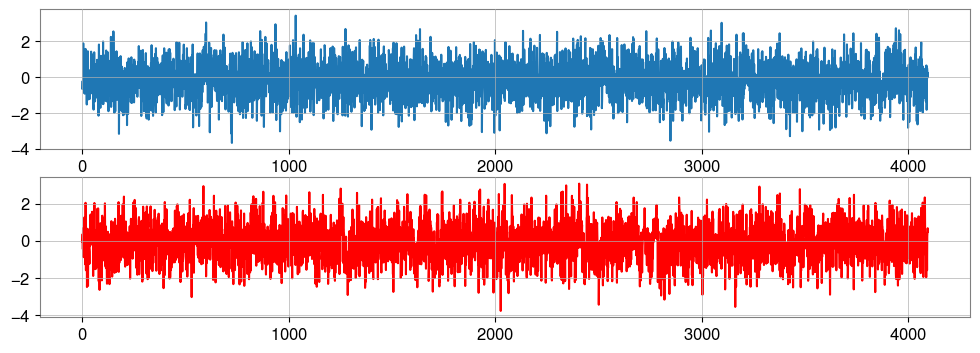

In [125]:
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
plt.plot(data[1,0,:], label="Background H1")
plt.subplot(2, 1, 2)
plt.plot(data[1,1,:], color="red", label="Background L1")

In [79]:
data.shape

(60, 2, 4096)